<a href="https://colab.research.google.com/github/giministk/ml/blob/main/%D0%9F%D1%80%D0%B0%D0%BA%D1%82%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B0%D1%8F_%D1%80%D0%B0%D0%B1%D0%BE%D1%82%D0%B0_%E2%84%9613_%D0%93%D0%B5%D0%BE%D0%B0%D0%BD%D0%B0%D0%BB%D0%B8%D0%B7_%D1%8D%D0%BA%D0%BE%D0%BB%D0%BE%D0%B3%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B8%D1%85_%D1%84%D0%B0%D0%BA%D1%82%D0%BE%D1%80%D0%BE%D0%B2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Практическая работа. Геоанализ экологических факторов городской среды с применением методов пространственной кластеризации**




















## **Цель работы**



Освоение методов пространственного анализа и машинного обучения для оценки экологической обстановки городской территории с использованием гексагональной сетки H3, с последующим применением различных алгоритмов кластеризации и классификации.

## **Задачи**



1. Освоить инструменты загрузки и агрегации экологических геоданных с использованием API OpenStreetMap
2. Реализовать анализ пространственного распределения экологических факторов с помощью гексагональной сетки H3
3. Применить и сравнить различные алгоритмы кластеризации для выявления однородных экологических зон
4. Обучить модели классификации для прогнозирования экологического состояния новых территорий

## **Теоретическая часть**



Современный геоэкологический анализ требует комплексного подхода к обработке пространственно-распределенных данных. Применение методов машинного обучения, в частности алгоритмов кластеризации (K-means, агломеративной, спектральной, DBSCAN, HDBSCAN), позволяет выявлять неявные закономерности в распределении экологических факторов городской среды и определять территории со схожими экологическими характеристиками.

## **Этапы работы**



### **1. Определение области исследования и подготовка данных**


- Выберите городскую территорию для анализа экологической обстановки
- Используя API OpenStreetMap, загрузите данные следующих категорий:
  - Источники загрязнения (промышленные предприятия, мусоропереработка, ТЭЦ)
  - Зеленые насаждения (парки, скверы, лесопарковые зоны)
  - Водные объекты (реки, водоемы)
  - Автомагистрали (категории дорог с интенсивным движением)
  - Административные районы города

In [ ]:
!pip install scikit-learn geopandas h3pandas h3~=3.0 leafmap mapclassify matplotlib streamlit osmnx openrouteservice polyline -q

import osmnx as ox
import geopandas as gpd
import pandas as pd
import numpy as np
import h3
import h3pandas
import leafmap
import folium
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import box, Polygon, Point
import warnings
warnings.filterwarnings('ignore')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.4/138.4 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 667.5/667.5 kB 37.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.2/9.2 MB 92.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.4/104.4 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 61.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 85.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 93.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 111.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 56.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━

In [ ]:
place = "Ногинск"
graph = ox.graph_from_place(place)

area = ox.geocode_to_gdf(place)

In [ ]:
m = leafmap.Map(draw_control=True, basemap='CartoDB.Positron')
bbox = m.user_roi_bounds()

if bbox:
    print(f"Выбранный bounding box: {bbox}")
else:
    bbox = [38.348, 55.8229, 38.5389, 55.93]
    print(f"Область не выбрана. Используем значение по умолчанию: {bbox}")

Область не выбрана. Используем значение по умолчанию: [38.348, 55.8229, 38.5389, 55.93]


In [ ]:
# Функция загрузки данных из OSM
def load_osm_data(bbox):
    west, south, east, north = bbox  # bbox = (west, south, east, north)

    # Теги для поиска
    tags = {
        'industrial': {'landuse': ['industrial', 'landfill'], 'power': 'plant', 'man_made': 'works'},
        'parks': {'leisure': 'park', 'natural': ['forest', 'wood']},
        'water': {'natural': 'water', 'water': ['lake', 'pond', 'river']},
        'highway': {'highway': ['motorway', 'trunk', 	'primary']},
        'boundary': {'boundary': 'administrative', 'admin_level': '8'}
    }

    # Загрузка данных с обработкой исключений
    data = {}
    for key, tag in tags.items():
        print(f"Загрузка {key}...")
        try:
            gdf = ox.features_from_bbox((west, south, east, north), tags=tag)
            data[key] = gdf
        except:
            print(f"Нет данных для {key} в заданном регионе. Создаём пустой GeoDataFrame.")
            # Создаём пустой GeoDataFrame с колонкой 'geometry' и устанавливаем CRS
            data[key] = gpd.GeoDataFrame(columns=['geometry'], crs="EPSG:4326")

    return data

# Загружаем данные
data = load_osm_data(bbox)

# Приводим данные к нужному CRS
crs_proj = "EPSG:3857"
for key in data.keys():
    # Проверяем, что GeoDataFrame не пустой
    if not data[key].empty and 'geometry' in data[key].columns:
        data[key] = data[key].to_crs(crs_proj)
    else:
        # Если пустой, создаём пустой GeoDataFrame с нужным CRS и колонкой 'geometry'
        data[key] = gpd.GeoDataFrame(columns=['geometry'], crs=crs_proj)

Загрузка industrial...
Загрузка parks...
Загрузка water...
Загрузка highway...
Загрузка boundary...


### **2. Агрегация данных с использованием гексагональной сетки H3**


- Сгенерируйте гексагональную сетку H3 оптимального разрешения для выбранной территории
- Для каждой ячейки H3 рассчитайте:
  - Количество и плотность источников загрязнения в радиусе 1600м
  - Площадь и процент покрытия зелеными насаждениями в радиусе 800м
  - Протяженность водных объектов в радиусе 1600м
  - Плотность автомагистралей в радиусе 1600м
- Выполните нормализацию полученных показателей
- Сформируйте интегральный индекс экологического благополучия территории


In [ ]:
from shapely.geometry import box, Polygon
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

# Функция анализа для каждой H3 ячейки
def analyze_h3_cell(geom):
    buffer_1600m = geom.buffer(1600)
    buffer_800m = geom.buffer(800)
    num_indust = data['industrial'][data['industrial'].geometry.intersects(buffer_1600m)].shape[0]
    water_length = data['water'][data['water'].geometry.intersects(buffer_1600m)].length.sum()
    highway_length = data['highway'][data['highway'].geometry.intersects(buffer_1600m)].length.sum()
    park_area = data['parks'][data['parks'].geometry.intersects(buffer_800m)].area.sum()
    return num_indust, water_length, highway_length, park_area,

# Генерация H3-сетки
resolution = 9  # Можно настроить разрешение

# Создаем полигон bbox
bbox_polygon = box(*bbox)
bbox_gdf = gpd.GeoDataFrame(geometry=[bbox_polygon], crs="EPSG:4326").to_crs(crs_proj)

# Получаем индексы H3 внутри bbox
h3_indexes = list(h3.polyfill_geojson(bbox_polygon.__geo_interface__, resolution))

# Импортируем Polygon из shapely.geometry
from shapely.geometry import Polygon

# Создаем GeoDataFrame с H3 ячейками
h3_geometries = [Polygon(h3.h3_to_geo_boundary(h, geo_json=True)) for h in h3_indexes]
h3_gdf = gpd.GeoDataFrame({'h3_index': h3_indexes, 'geometry': h3_geometries}, crs="EPSG:4326").to_crs(crs_proj)

# Применяем анализ к каждой H3 ячейке
h3_gdf[['num_indust', 'water_length', 'highway_length', 'park_area']] = h3_gdf.geometry.apply(
    lambda geom: pd.Series(analyze_h3_cell(geom))
)

columns_to_normalize = ['num_indust', 'water_length', 'highway_length', 'park_area'
]

# Нормализация результатов
h3_gdf[columns_to_normalize] = scaler.fit_transform(h3_gdf[columns_to_normalize])

positive = ['water_length', 'park_area']
negative = ['num_indust', 'highway_length']

# Вычисление итогового индекса
h3_gdf['index_score'] = h3_gdf[positive].sum(axis=1) - h3_gdf[negative].sum(axis=1)

### **3. Определение оптимального числа кластеров**


- Постройте график метода локтя (Elbow method) для определения оптимального числа кластеров
- Оцените качество кластеризации с помощью внутренних метрик кластеризации
- Определите оптимальное число кластеров на основе комбинации различных метрик

In [ ]:
map_result = leafmap.Map(center=[(bbox[1]+bbox[3])/2, (bbox[0]+bbox[2])/2], zoom=12)

# Добавляем H3 ячейки
map_result.add_data(
    h3_gdf,
    column="index_score",
    cmap="OrRd_r",
    k = 8,
    legend_title="index_score",
    layer_name="H3 Сетка",
    style={
        "stroke": True,     # или False
        "weight": 0,        # толщина обводки
        "fillOpacity": 0.7, # прозрачность заливки
    }
)

# Отображаем карту
map_result

Map(center=[55.87645, 38.44345], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', '…

### **4. Сравнительный анализ алгоритмов кластеризации**


- Реализуйте и сравните следующие алгоритмы кластеризации:
  - K-means
  - Агломеративная кластеризация
  - Спектральная кластеризация
  - DBSCAN (с оптимальным значением eps)
  - HDBSCAN
- Для каждого алгоритма оцените:
  - Качество кластеризации по основным метрикам
  - Распределение точек по кластерам
  - Характерные особенности выявленных кластеров

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

# Выбираем числовые признаки для кластеризации
features = ['num_indust', 'water_length', 'highway_length', 'park_area']

# Делаем копию исходного набора для обработки методами ML
X = h3_gdf[features].copy()
X

,num_indust,water_length,highway_length,park_area
0,0.043478,0.735261,0.000000,0.159021
1,0.217391,0.781395,0.110701,0.132089
2,0.478261,0.729371,0.095930,0.010763
3,0.130435,0.015669,0.000000,0.053409
4,0.086957,0.002278,0.158411,0.051981
...,...,...,...,...
1418,0.000000,0.001657,0.158411,0.696838
1419,0.173913,0.032258,0.219130,0.011935
1420,0.130435,0.006415,0.230930,0.009172
1421,0.086957,0.020421,0.140330,0.051479


In [ ]:
# Масштабирование признаков (важно для кластеризации)

# scaler = StandardScaler()
scaler = MinMaxScaler()

X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=features)

# Сохраняем оригинальные индексы
X_scaled_df.index = h3_gdf.index

print("Размерность набора данных:", X_scaled.shape)

Размерность набора данных: (1423, 4)


In [ ]:
print("Первые 5 строк масштабированных данных:")
X_scaled_df.head(20)

Первые 5 строк масштабированных данных:


,num_indust,water_length,highway_length,park_area
0,0.043478,0.735261,0.000000,0.159021
1,0.217391,0.781395,0.110701,0.132089
2,0.478261,0.729371,0.095930,0.010763
3,0.130435,0.015669,0.000000,0.053409
4,0.086957,0.002278,0.158411,0.051981
5,0.000000,0.006285,0.000000,0.169497
6,0.000000,0.020126,0.209874,0.713708
7,0.000000,0.724090,0.091909,0.000000
8,0.130435,0.024599,0.000000,0.086528
9,0.086957,0.021341,0.192025,0.070863


In [ ]:
%%capture
!pip install kneed

### **5. Визуализация и интерпретация результатов**


- Визуализируйте результаты кластеризации на карте с использованием leafmap
- Постройте тепловые карты средних значений экологических факторов для каждого кластера
- Выполните снижение размерности с помощью PCA и визуализируйте кластеры в двумерном пространстве
- Проанализируйте профили кластеров и составьте их экологические характеристики
- Разработайте рекомендации по улучшению экологической обстановки для каждого типа территории

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import matplotlib.pyplot as plt
from kneed import KneeLocator

def find_optimal_clusters(X, max_k=15):
    """
    Определение оптимального числа кластеров с помощью различных метрик
    """
    # Метрики для оценки качества кластеризации
    inertias = []  # Для метода локтя
    silhouette_scores = []  # Silhouette Score
    calinski_scores = []  # Calinski-Harabasz Index
    davies_scores = []  # Davies-Bouldin Index

    # Вычисляем значения метрик для разного числа кластеров
    k_range = range(2, max_k + 1)
    for k in k_range:
        print(f"Оценка для k={k}...")
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        kmeans.fit(X)

        labels = kmeans.labels_
        inertias.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(X, labels))
        calinski_scores.append(calinski_harabasz_score(X, labels))
        davies_scores.append(davies_bouldin_score(X, labels))

    # Визуализация результатов
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Метод локтя (Inertia)
    axes[0, 0].plot(k_range, inertias, 'o-', color='blue', linewidth=2, markersize=8)
    axes[0, 0].set_xlabel('Число кластеров', fontsize=12)
    axes[0, 0].set_ylabel('Inertia', fontsize=12)
    axes[0, 0].set_title('Метод локтя (Inertia)', fontsize=14)
    axes[0, 0].grid(True, linestyle='--', alpha=0.7)

    # Silhouette Score (чем выше, тем лучше)
    axes[0, 1].plot(k_range, silhouette_scores, 'o-', color='green', linewidth=2, markersize=8)
    axes[0, 1].set_xlabel('Число кластеров', fontsize=12)
    axes[0, 1].set_ylabel('Silhouette Score', fontsize=12)
    axes[0, 1].set_title('Silhouette Score (выше - лучше)', fontsize=14)
    axes[0, 1].grid(True, linestyle='--', alpha=0.7)

    # Calinski-Harabasz Index (чем выше, тем лучше)
    axes[1, 0].plot(k_range, calinski_scores, 'o-', color='purple', linewidth=2, markersize=8)
    axes[1, 0].set_xlabel('Число кластеров', fontsize=12)
    axes[1, 0].set_ylabel('Calinski-Harabasz Index', fontsize=12)
    axes[1, 0].set_title('Calinski-Harabasz Index (выше - лучше)', fontsize=14)
    axes[1, 0].grid(True, linestyle='--', alpha=0.7)

    # Davies-Bouldin Index (чем ниже, тем лучше)
    axes[1, 1].plot(k_range, davies_scores, 'o-', color='red', linewidth=2, markersize=8)
    axes[1, 1].set_xlabel('Число кластеров', fontsize=12)
    axes[1, 1].set_ylabel('Davies-Bouldin Index', fontsize=12)
    axes[1, 1].set_title('Davies-Bouldin Index (ниже - лучше)', fontsize=14)
    axes[1, 1].grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

    # Находим оптимальное число кластеров по разным метрикам

    # Метод локтя (Inertia)
    kl = KneeLocator(k_range, inertias, curve='convex', direction='decreasing')
    optimal_k_inertia = kl.elbow if kl.elbow is not None else "Не определено"

    # Silhouette Score (максимальное значение)
    optimal_k_silhouette = k_range[np.argmax(silhouette_scores)]

    # Calinski-Harabasz (максимальное значение)
    optimal_k_calinski = k_range[np.argmax(calinski_scores)]

    # Davies-Bouldin (минимальное значение)
    optimal_k_davies = k_range[np.argmin(davies_scores)]

    print("\nОптимальное число кластеров по разным метрикам:")
    print(f"Метод локтя (Inertia): {optimal_k_inertia}")
    print(f"Silhouette Score: {optimal_k_silhouette}")
    print(f"Calinski-Harabasz Index: {optimal_k_calinski}")
    print(f"Davies-Bouldin Index: {optimal_k_davies}")

    # Создаем таблицу со значениями метрик
    metrics_df = pd.DataFrame({
        'Число кластеров': list(k_range),
        'Inertia': inertias,
        'Silhouette Score': silhouette_scores,
        'Calinski-Harabasz': calinski_scores,
        'Davies-Bouldin': davies_scores
    })

    print("\nТаблица со значениями метрик:")
    display(metrics_df)

    return {
        'inertia': optimal_k_inertia if optimal_k_inertia != "Не определено" else None,
        'silhouette': optimal_k_silhouette,
        'calinski': optimal_k_calinski,
        'davies': optimal_k_davies,
        'metrics_df': metrics_df
    }

Оценка для k=2...
Оценка для k=3...
Оценка для k=4...
Оценка для k=5...
Оценка для k=6...
Оценка для k=7...
Оценка для k=8...
Оценка для k=9...
Оценка для k=10...
Оценка для k=11...
Оценка для k=12...


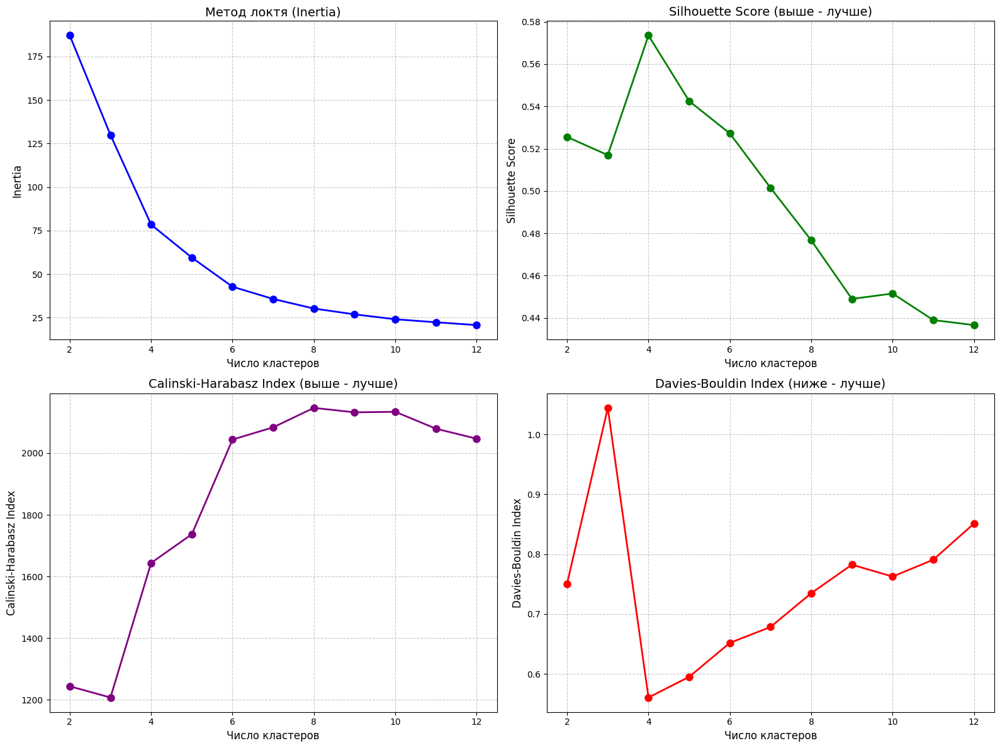


Оптимальное число кластеров по разным метрикам:
Метод локтя (Inertia): 6
Silhouette Score: 4
Calinski-Harabasz Index: 8
Davies-Bouldin Index: 4

Таблица со значениями метрик:


,Число кластеров,Inertia,Silhouette Score,Calinski-Harabasz,Davies-Bouldin
0,2,187.127041,0.525541,1243.855611,0.750834
1,3,129.942351,0.516967,1207.453962,1.044487
2,4,78.405066,0.573539,1644.060028,0.560604
3,5,59.479792,0.542511,1737.024498,0.595123
4,6,42.729269,0.527190,2044.153188,0.651888
5,7,35.699370,0.501484,2083.891136,0.678493
6,8,30.197654,0.476658,2146.956273,0.734869
7,9,26.861019,0.448962,2132.405029,0.782511
8,10,24.047504,0.451514,2134.210932,0.762625
9,11,22.314374,0.438966,2079.378596,0.790855


In [ ]:
optimal_clusters = find_optimal_clusters(X_scaled, max_k=12)

Оптимальное значение eps (точка изгиба): 0.1394


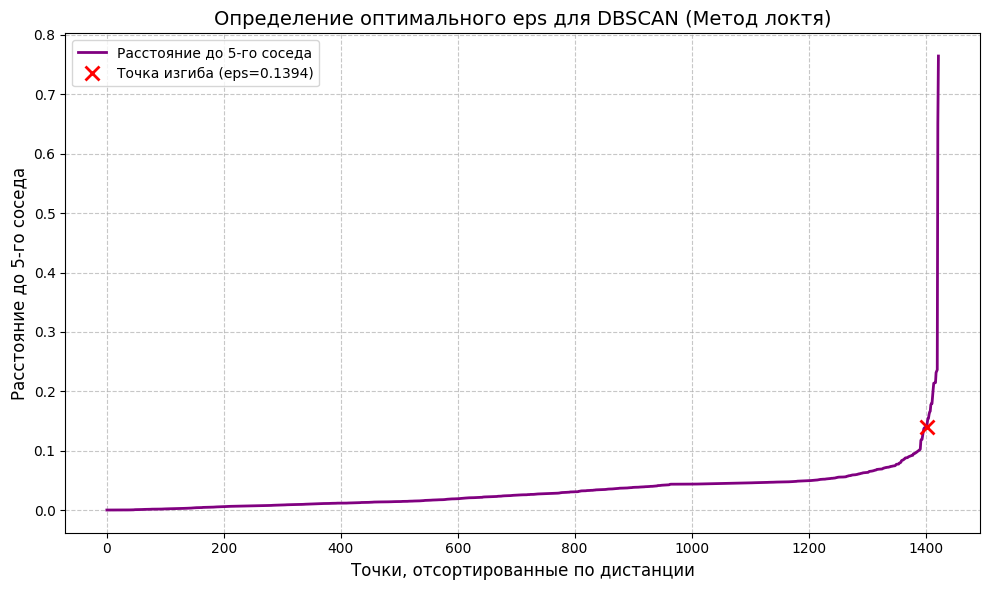

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator

def find_optimal_eps(X, k=5):
    """
    Определение оптимального значения eps для алгоритма DBSCAN
    с визуализацией точки максимального изгиба.
    """
    # Находим расстояния до k-го ближайшего соседа [[1]] [[9]]
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)

    # Берем расстояние до k-го соседа (индекс k-1) и сортируем
    distances = np.sort(distances[:, k-1])
    indices = np.arange(len(distances)) # Индексы для оси X

    # Находим точку максимального изгиба (перегиба) ДО отрисовки
    kl = KneeLocator(indices, distances, curve='convex', direction='increasing')

    # Визуализируем график расстояний
    plt.figure(figsize=(10, 6))
    plt.plot(indices, distances, linewidth=2, color='purple', label=f'Расстояние до {k}-го соседа')
    plt.xlabel('Точки, отсортированные по дистанции', fontsize=12)
    plt.ylabel(f'Расстояние до {k}-го соседа', fontsize=12)
    plt.title('Определение оптимального eps для DBSCAN (Метод локтя)', fontsize=14)

    # Если точка изгиба найдена, отмечаем ее на графике
    if kl.knee is not None:
        optimal_eps = distances[kl.knee]
        plt.plot(kl.knee, optimal_eps, 'rx', markersize=10, mew=2, # Красный крестик, увеличенный размер, толщина линии
                 label=f'Точка изгиба (eps={optimal_eps:.4f})')
        print(f"Оптимальное значение eps (точка изгиба): {optimal_eps:.4f}")
    else:
        optimal_eps = None # Устанавливаем в None, если точка не найдена
        print("Не удалось автоматически определить точку изгиба.")

    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend() # Показываем легенду с метками
    plt.tight_layout()
    plt.show()

    # Возвращаем найденное значение или fallback
    if optimal_eps is not None:
        return optimal_eps
    else:
        # Возвращаем примерное значение, если автоматическое определение не удалось

        eps_guess = np.percentile(distances, 10)
        print(f"Предлагаемое значение eps (10-й процентиль): {eps_guess:.4f}")
        return eps_guess


# Определяем оптимальный параметр eps для DBSCAN
optimal_eps = find_optimal_eps(X_scaled, k=5)

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

def evaluate_clustering(X, labels, algorithm_name):
    """
    Оценка качества кластеризации по различным метрикам
    """
    n_clusters = len(np.unique(labels))
    if -1 in labels:  # Исключаем шумовые точки для DBSCAN/HDBSCAN
        n_clusters -= 1

    metrics = {}

    if n_clusters > 1:  # Все метрики требуют минимум 2 кластера
        metrics['silhouette'] = silhouette_score(X, labels)
        metrics['calinski'] = calinski_harabasz_score(X, labels)
        metrics['davies'] = davies_bouldin_score(X, labels)
    else:
        metrics['silhouette'] = np.nan
        metrics['calinski'] = np.nan
        metrics['davies'] = np.nan

    print(f"\nМетрики качества кластеризации для {algorithm_name}:")
    print(f"Количество кластеров: {n_clusters}")
    print(f"Silhouette Score: {metrics['silhouette']:.4f}")
    print(f"Calinski-Harabasz Index: {metrics['calinski']:.4f}")
    print(f"Davies-Bouldin Index: {metrics['davies']:.4f}")

    return metrics

In [ ]:
def visualize_clusters_2d(X, labels, algorithm_name, features):
    """
    Визуализация результатов кластеризации с помощью PCA
    """
    # Уменьшаем размерность до 2D с помощью PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # Создаем DataFrame для визуализации
    viz_df = pd.DataFrame({
        'PC1': X_pca[:, 0],
        'PC2': X_pca[:, 1],
        'cluster': labels
    })

    # Визуализируем результаты
    plt.figure(figsize=(12, 8))
    scatter = sns.scatterplot(
        x='PC1', y='PC2',
        hue='cluster',
        data=viz_df,
        palette='viridis',
        s=80,
        alpha=0.7
    )

    # Добавляем центры кластеров (если есть)
    unique_clusters = np.unique(labels)
    for cluster in unique_clusters:
        if cluster != -1:  # Пропускаем шумовые точки
            cluster_center = X_pca[labels == cluster].mean(axis=0)
            plt.annotate(f'Кластер {cluster}',
                       xy=(cluster_center[0], cluster_center[1]),
                       fontsize=12,
                       color='black',
                       fontweight='bold',
                       bbox=dict(boxstyle="round,pad=0.3", fc='white', alpha=0.7))

    plt.title(f'Кластеризация методом {algorithm_name}', fontsize=15)
    plt.xlabel('Главная компонента 1', fontsize=12)
    plt.ylabel('Главная компонента 2', fontsize=12)

    # Добавляем информацию о доле сохраненной дисперсии
    explained_variance = pca.explained_variance_ratio_
    plt.xlabel(f'PC1 ({explained_variance[0]:.2%} дисперсии)', fontsize=12)
    plt.ylabel(f'PC2 ({explained_variance[1]:.2%} дисперсии)', fontsize=12)

    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # Создаем тепловую карту средних значений признаков по кластерам
    # Вычисляем средние значения признаков для каждого кластера
    cluster_means = []
    for cluster in unique_clusters:
        if cluster != -1:  # Пропускаем шумовые точки
            cluster_data = X[labels == cluster]
            cluster_means.append(cluster_data.mean(axis=0))

    # Создаем DataFrame для тепловой карты
    cluster_means_df = pd.DataFrame(
        cluster_means,
        index=[f'Кластер {i}' for i in unique_clusters if i != -1],
        columns=features
    )

    # Визуализируем тепловую карту
    plt.figure(figsize=(12, 8))
    sns.heatmap(cluster_means_df, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
    plt.title(f'Средние значения признаков по кластерам ({algorithm_name})', fontsize=15)
    plt.tight_layout()
    plt.show()

    return explained_variance

In [ ]:
def analyze_clusters(X, labels, algorithm_name, features):
    """
    Подробный анализ результатов кластеризации
    """
    unique_clusters = np.unique(labels)
    n_clusters = len(unique_clusters)
    if -1 in unique_clusters:  # Исключаем шумовые точки для DBSCAN/HDBSCAN
        n_clusters -= 1

    print(f"\n--- Анализ кластеров для метода {algorithm_name} ---")
    print(f"Количество кластеров: {n_clusters}")

    # Распределение точек по кластерам
    cluster_counts = pd.Series(labels).value_counts().sort_index()
    cluster_percents = (cluster_counts / len(labels) * 100).round(2)

    print("\nРаспределение точек по кластерам:")
    distribution_df = pd.DataFrame({
        'Количество точек': cluster_counts,
        'Процент': cluster_percents
    })
    display(distribution_df)

    # Создаем DataFrame с данными и метками кластеров
    X_with_labels = pd.DataFrame(X, columns=features)
    X_with_labels['cluster'] = labels

    # Статистика по кластерам
    print("\nСредние значения признаков по кластерам:")
    display(X_with_labels.groupby('cluster').mean())

    print("\nМинимальные значения признаков по кластерам:")
    display(X_with_labels.groupby('cluster').min())

    print("\nМаксимальные значения признаков по кластерам:")
    display(X_with_labels.groupby('cluster').max())

    # Визуализируем распределение для каждого признака по кластерам
    for feature in features:
        plt.figure(figsize=(12, 6))
        sns.boxplot(x='cluster', y=feature, data=X_with_labels)
        plt.title(f'Распределение {feature} по кластерам ({algorithm_name})', fontsize=15)
        plt.xlabel('Кластер', fontsize=12)
        plt.ylabel(feature, fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.show()

    return X_with_labels

In [ ]:
# Выбираем число кластеров по умолчанию я выбираю по критерию inertia,
# но Вы можете установить более оптимальное значения для Вашего случая

k = optimal_clusters['inertia']

print(f"Выбрано число кластеров: {k}")

Выбрано число кластеров: 6


In [ ]:
kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(X_scaled)

In [ ]:
kmeans_metrics = evaluate_clustering(X_scaled, kmeans_labels, "K-means")


Метрики качества кластеризации для K-means:
Количество кластеров: 6
Silhouette Score: 0.5272
Calinski-Harabasz Index: 2044.1532
Davies-Bouldin Index: 0.6519


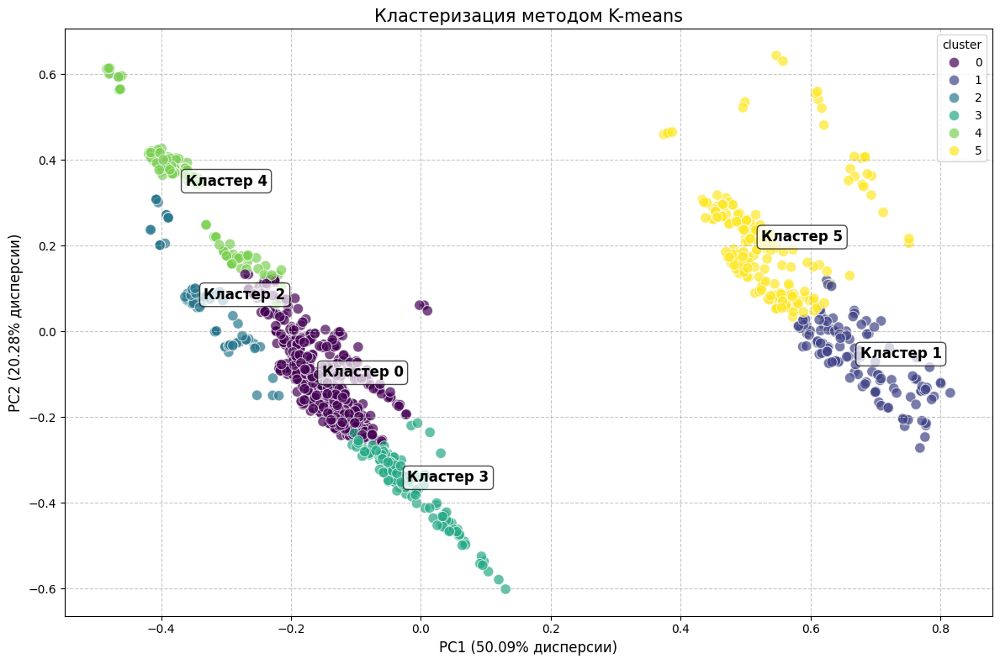

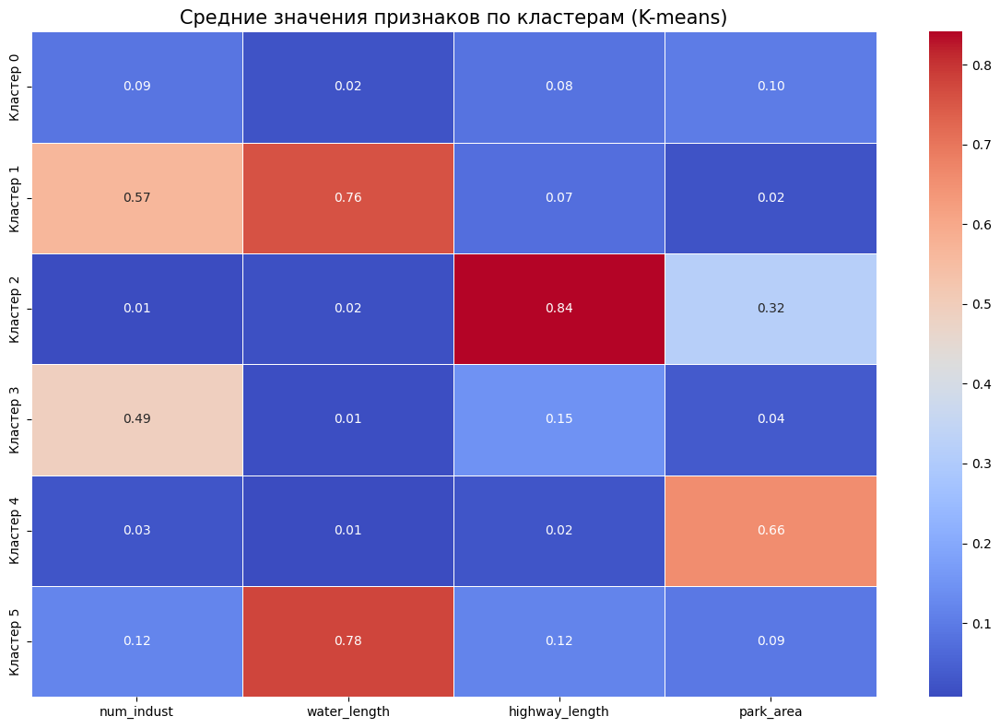

In [ ]:
explained_variance = visualize_clusters_2d(X_scaled, kmeans_labels, "K-means", features)


--- Анализ кластеров для метода K-means ---
Количество кластеров: 6

Распределение точек по кластерам:


,Количество точек,Процент
0,640,44.98
1,124,8.71
2,99,6.96
3,134,9.42
4,196,13.77
5,230,16.16



Средние значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
0,0.086345,0.022370,0.082989,0.100091
1,0.567321,0.759089,0.073447,0.021003
2,0.007905,0.017090,0.841225,0.318114
3,0.490915,0.012037,0.145042,0.036076
4,0.026176,0.007644,0.024617,0.657791
5,0.119471,0.777463,0.115202,0.093619



Минимальные значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
0,0.000000,0.00000,0.000000,0.000000
1,0.347826,0.72242,0.000000,0.000083
2,0.000000,0.00000,0.812206,0.020797
3,0.260870,0.00000,0.000000,0.000261
4,0.000000,0.00000,0.000000,0.404299
5,0.000000,0.72409,0.000000,0.000000



Максимальные значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
0,0.304348,0.246282,0.418231,0.375125
1,1.000000,0.833518,0.266845,0.128765
2,0.043478,0.046732,1.000000,0.604350
3,1.000000,0.093044,0.394378,0.093377
4,0.304348,0.043029,0.209874,1.000000
5,0.347826,1.000000,0.930633,0.467004


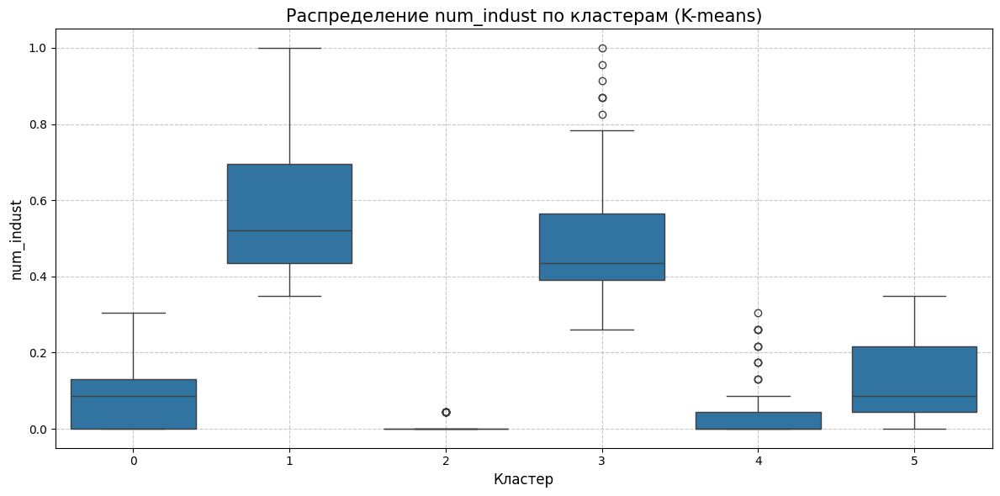

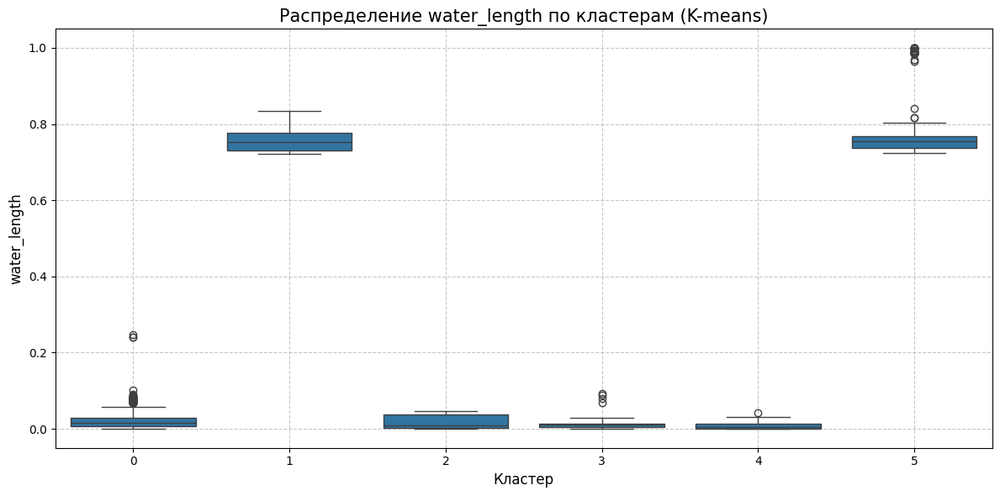

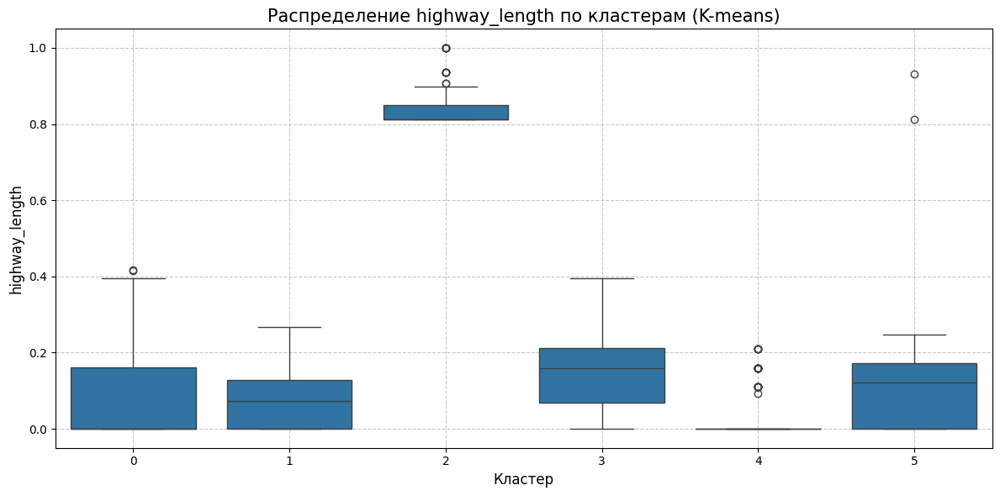

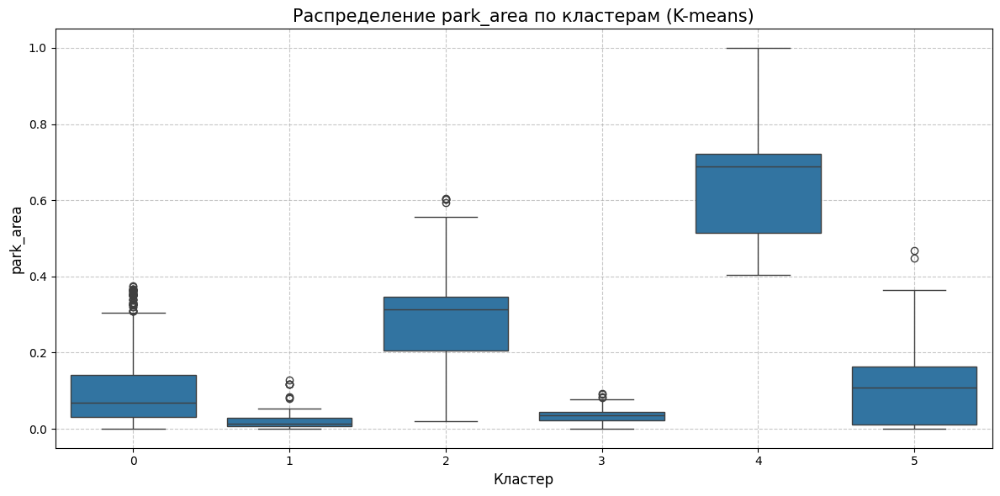

In [ ]:
kmeans_analysis = analyze_clusters(X_scaled, kmeans_labels, "K-means", features)

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Применение агломеративной кластеризации
agglom = AgglomerativeClustering(n_clusters=k)
agglom_labels = agglom.fit_predict(X_scaled)

In [ ]:
agglom_metrics = evaluate_clustering(X_scaled, agglom_labels, "Агломеративная кластеризация")


Метрики качества кластеризации для Агломеративная кластеризация:
Количество кластеров: 6
Silhouette Score: 0.5164
Calinski-Harabasz Index: 1930.9302
Davies-Bouldin Index: 0.6755


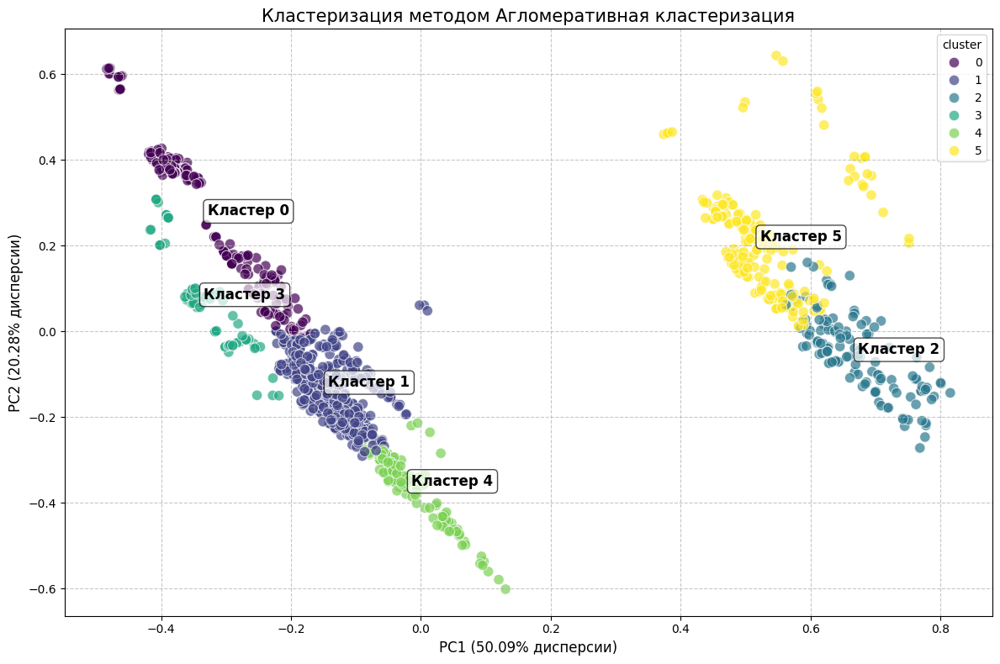

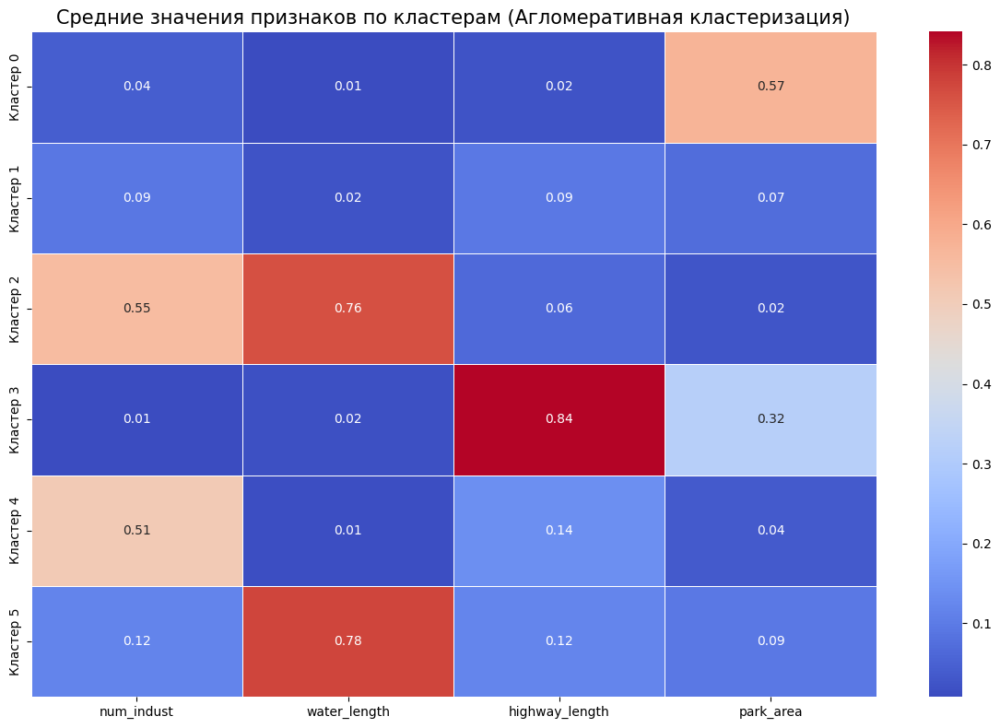

array([0.50092288, 0.20283224])

In [ ]:
visualize_clusters_2d(X_scaled, agglom_labels, "Агломеративная кластеризация", features)


--- Анализ кластеров для метода Агломеративная кластеризация ---
Количество кластеров: 6

Распределение точек по кластерам:


,Количество точек,Процент
0,263,18.48
1,585,41.11
2,129,9.07
3,99,6.96
4,122,8.57
5,225,15.81



Средние значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
0,0.040668,0.008967,0.020949,0.573086
1,0.091119,0.023198,0.093511,0.072917
2,0.553084,0.760821,0.063709,0.024315
3,0.007905,0.017090,0.841225,0.318114
4,0.509622,0.012283,0.140656,0.036403
5,0.117681,0.776878,0.121713,0.093334



Минимальные значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
0,0.000000,0.00000,0.000000,0.241105
1,0.000000,0.00000,0.000000,0.000000
2,0.217391,0.72242,0.000000,0.000083
3,0.000000,0.00000,0.812206,0.020797
4,0.347826,0.00000,0.000000,0.000261
5,0.000000,0.72409,0.000000,0.000000



Максимальные значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
0,0.304348,0.046732,0.209874,1.000000
1,0.304348,0.246282,0.418231,0.242832
2,1.000000,0.840400,0.266845,0.162340
3,0.043478,0.046732,1.000000,0.604350
4,1.000000,0.093044,0.394378,0.093377
5,0.347826,1.000000,0.930633,0.467004


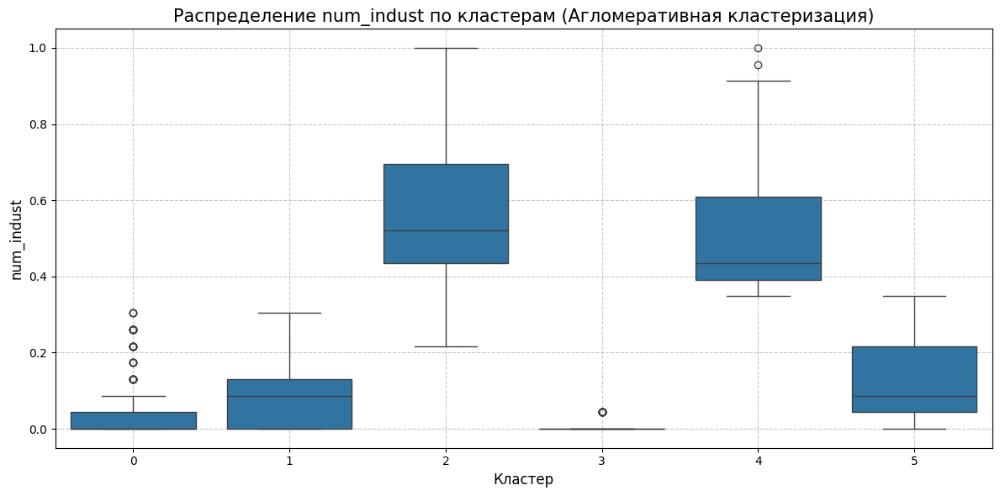

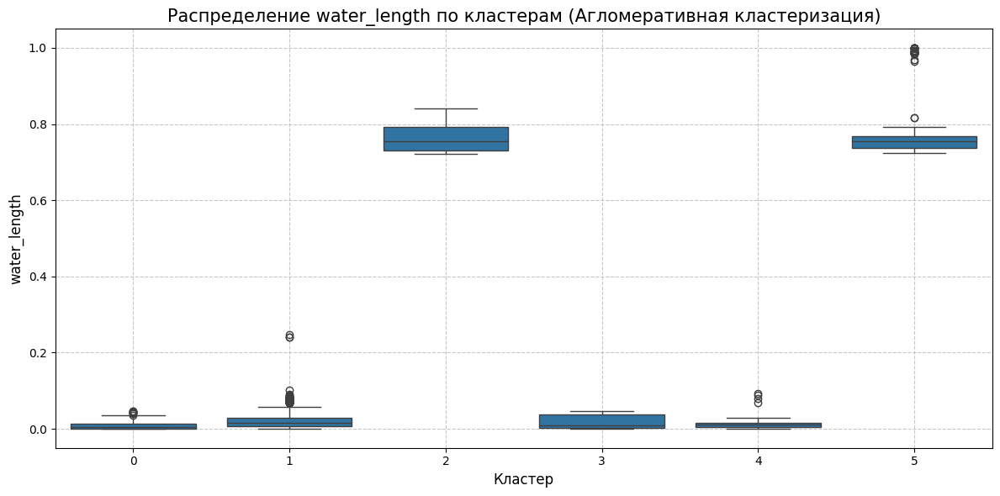

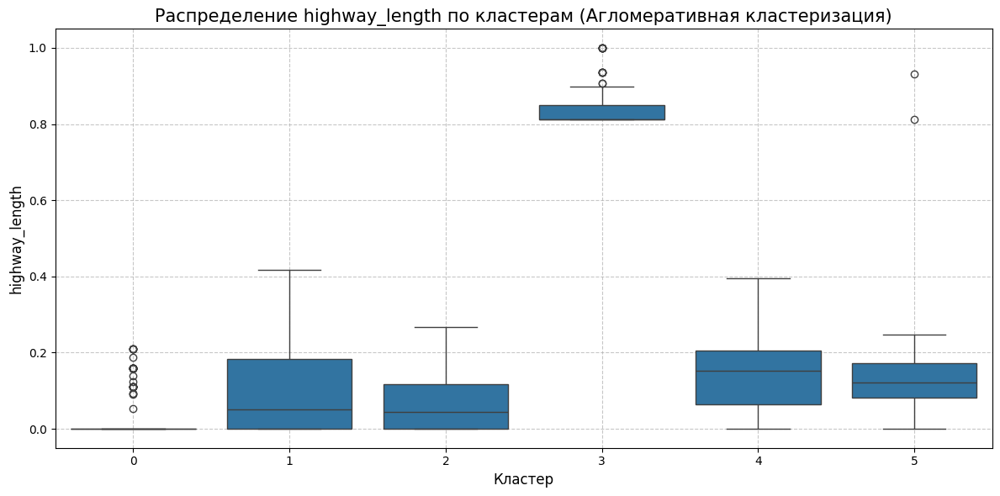

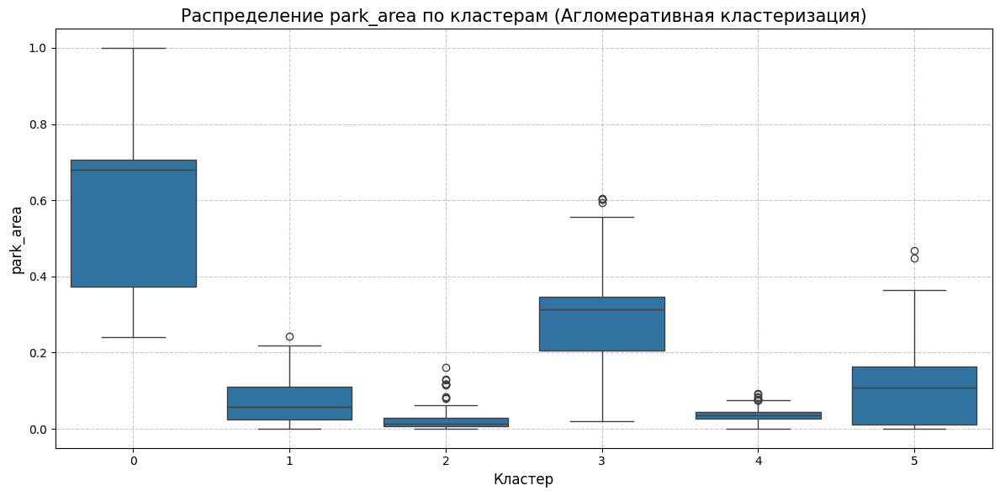

In [ ]:
agglom_analysis = analyze_clusters(X_scaled, agglom_labels, "Агломеративная кластеризация", features)

In [ ]:
from sklearn.cluster import SpectralClustering

# Применение спектральной кластеризации
spectral = SpectralClustering(n_clusters=k, random_state=42, assign_labels='kmeans')
spectral_labels = spectral.fit_predict(X_scaled)

In [ ]:
# Оценка качества кластеризации
spectral_metrics = evaluate_clustering(X_scaled, spectral_labels, "Спектральная кластеризация")


Метрики качества кластеризации для Спектральная кластеризация:
Количество кластеров: 6
Silhouette Score: 0.5219
Calinski-Harabasz Index: 1959.1932
Davies-Bouldin Index: 0.6305


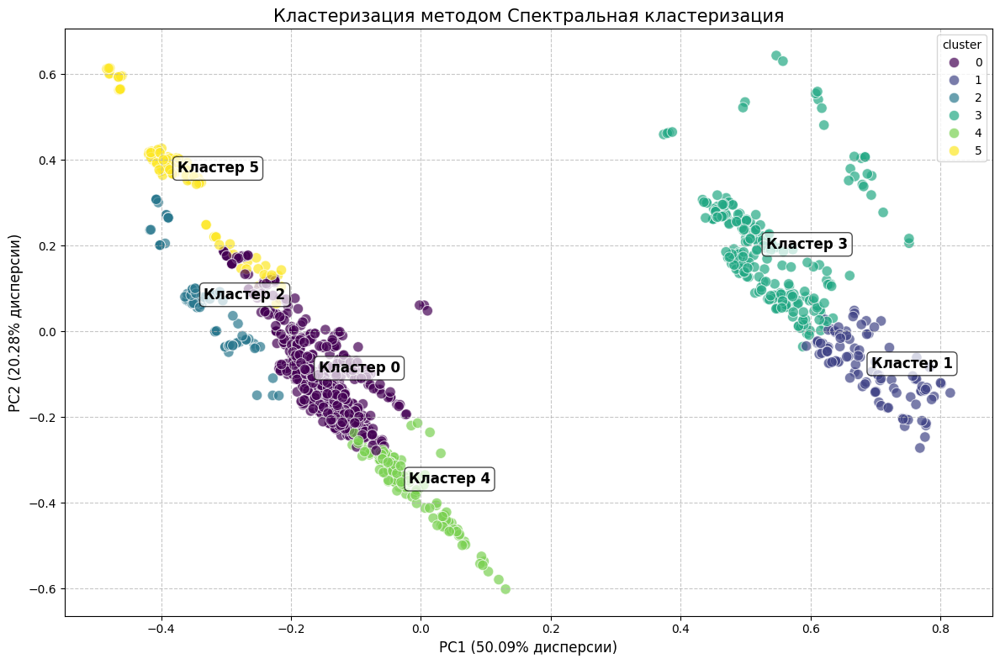

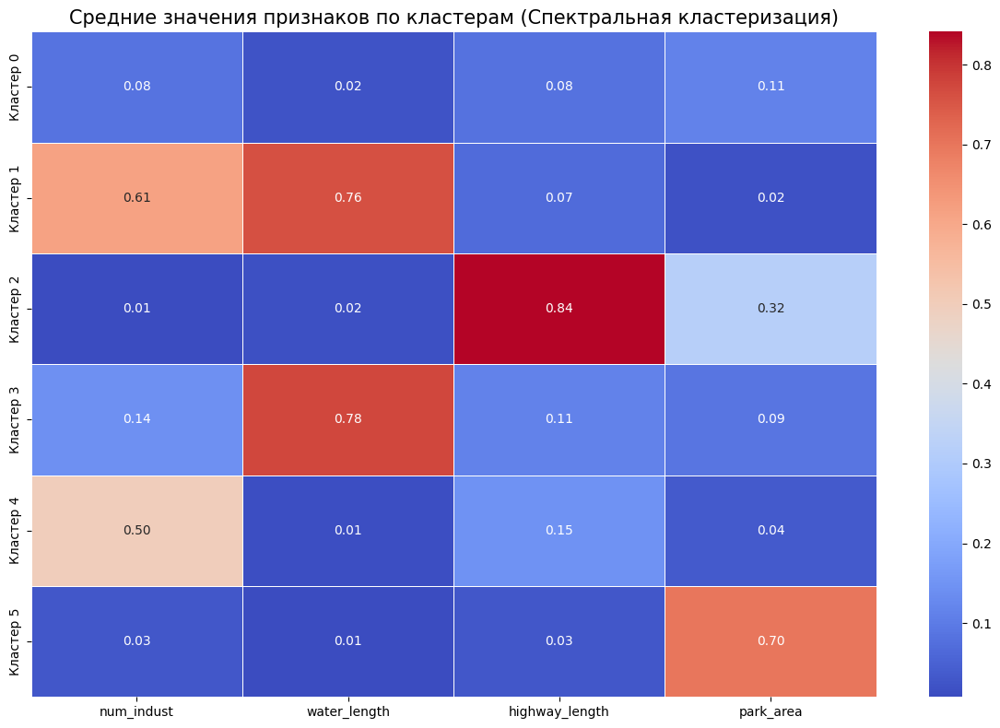

array([0.50092288, 0.20283224])

In [ ]:
visualize_clusters_2d(X_scaled, spectral_labels, "Спектральная кластеризация", features)


--- Анализ кластеров для метода Спектральная кластеризация ---
Количество кластеров: 6

Распределение точек по кластерам:


,Количество точек,Процент
0,674,47.36
1,100,7.03
2,99,6.96
3,254,17.85
4,129,9.07
5,167,11.74



Средние значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
0,0.084312,0.021687,0.079719,0.113179
1,0.613913,0.760626,0.067728,0.019156
2,0.007905,0.017090,0.841225,0.318114
3,0.143444,0.775122,0.113508,0.087485
4,0.498483,0.011998,0.146586,0.036663
5,0.030200,0.007565,0.028341,0.699445



Минимальные значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
0,0.000000,0.00000,0.000000,0.000000
1,0.391304,0.72242,0.000000,0.000083
2,0.000000,0.00000,0.812206,0.020797
3,0.000000,0.72242,0.000000,0.000000
4,0.304348,0.00000,0.000000,0.000261
5,0.000000,0.00000,0.000000,0.443745



Максимальные значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
0,0.304348,0.246282,0.418231,0.442611
1,1.000000,0.833518,0.215651,0.117981
2,0.043478,0.046732,1.000000,0.604350
3,0.434783,1.000000,0.930633,0.467004
4,1.000000,0.093044,0.394378,0.093377
5,0.304348,0.043029,0.209874,1.000000


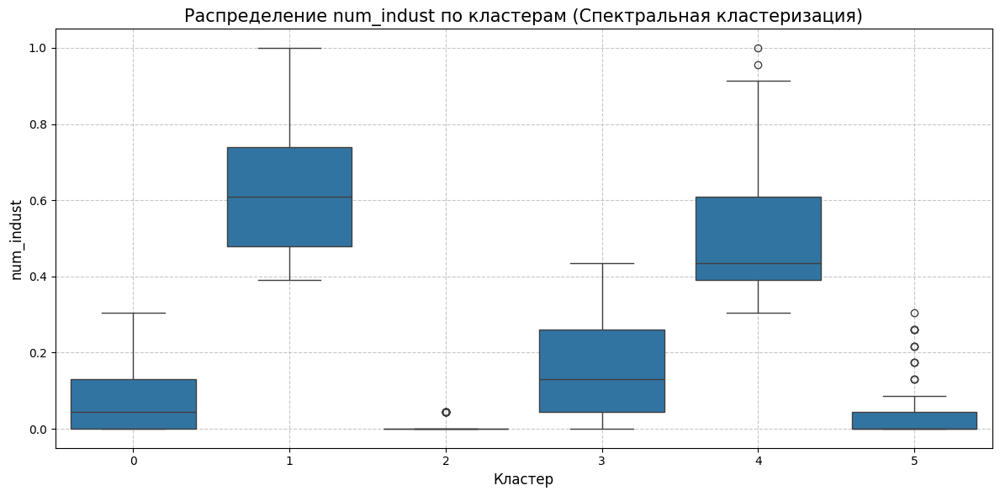

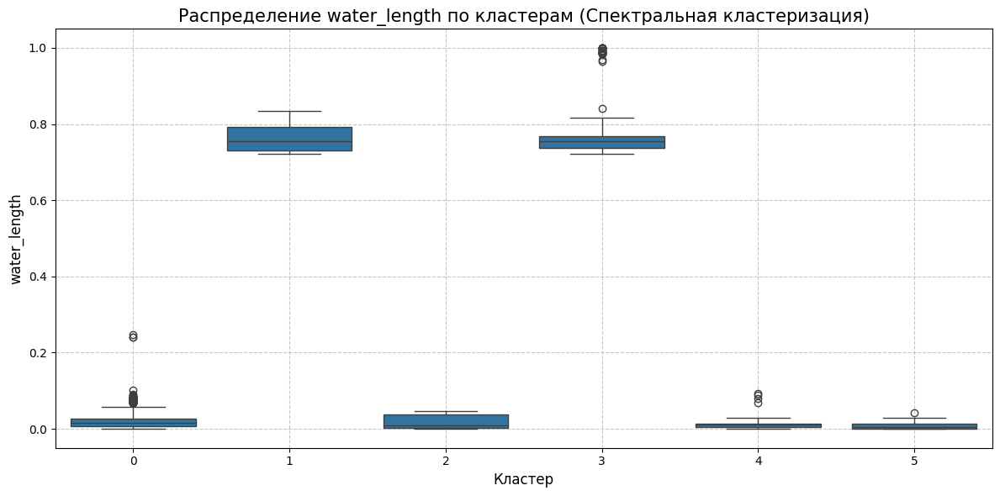

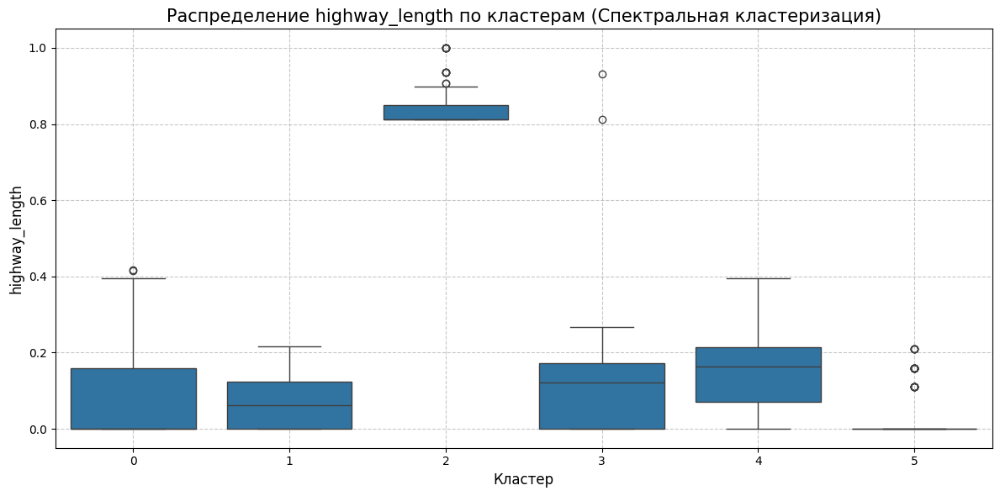

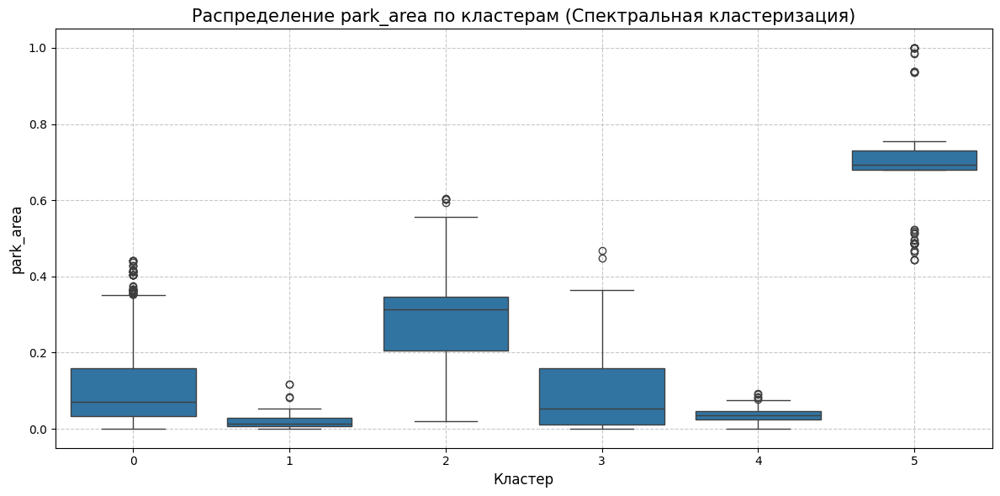

In [ ]:
spectral_analysis = analyze_clusters(X_scaled, spectral_labels, "Спектральная кластеризация", features)

In [ ]:
from sklearn.cluster import DBSCAN

# Применение DBSCAN
dbscan = DBSCAN(eps=optimal_eps, min_samples=5)
dbscan_labels = dbscan.fit_predict(X_scaled)

In [ ]:
dbscan_metrics = evaluate_clustering(X_scaled, dbscan_labels, "DBSCAN")


Метрики качества кластеризации для DBSCAN:
Количество кластеров: 7
Silhouette Score: 0.4439
Calinski-Harabasz Index: 688.9439
Davies-Bouldin Index: 1.0939


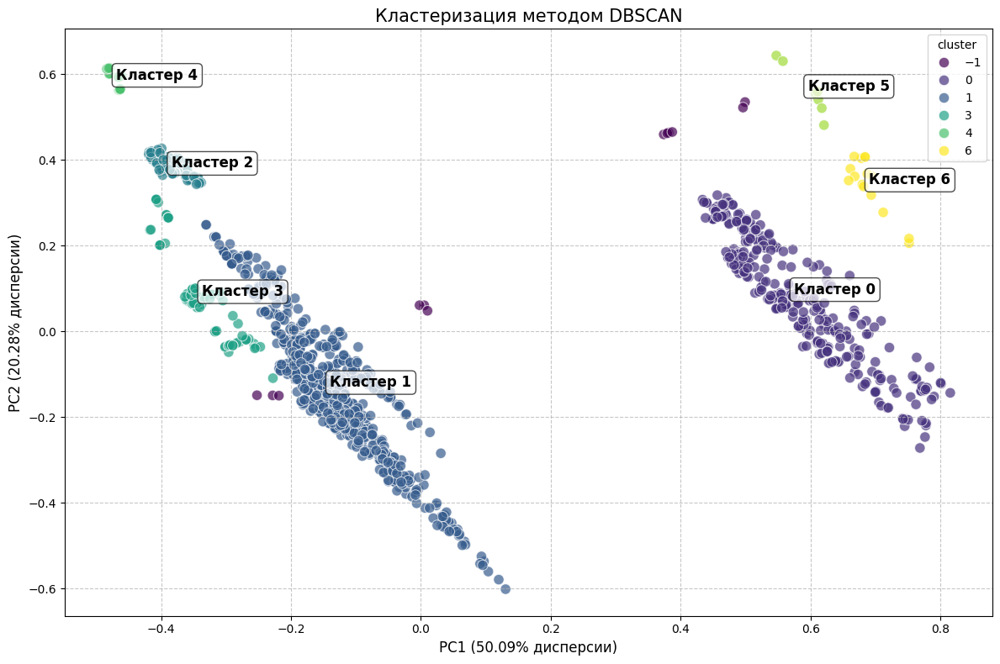

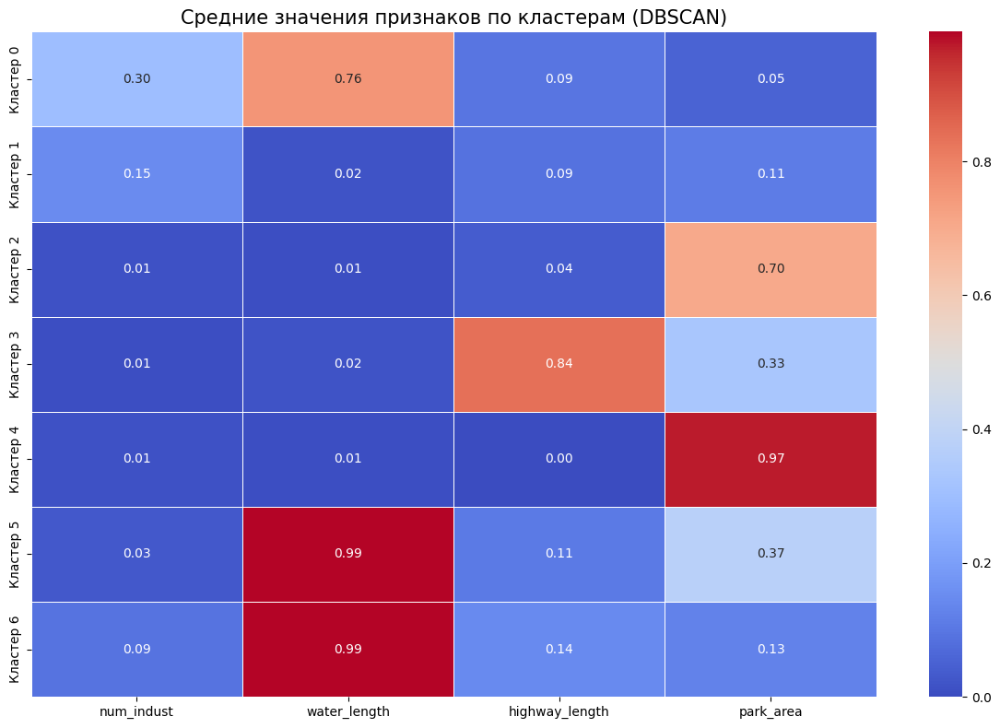

array([0.50092288, 0.20283224])

In [ ]:
visualize_clusters_2d(X_scaled, dbscan_labels, "DBSCAN", features)


--- Анализ кластеров для метода DBSCAN ---
Количество кластеров: 7

Распределение точек по кластерам:


,Количество точек,Процент
-1,12,0.84
0,326,22.91
1,824,57.91
2,127,8.92
3,96,6.75
4,16,1.12
5,7,0.49
6,15,1.05



Средние значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
-1,0.010870,0.483663,0.450932,0.221781
0,0.295279,0.755066,0.093838,0.053642
1,0.150802,0.019051,0.087769,0.111996
2,0.013009,0.006991,0.037268,0.704898
3,0.007246,0.016529,0.836264,0.327135
4,0.013587,0.007008,0.000000,0.974398
5,0.031056,0.993877,0.108012,0.373738
6,0.089855,0.991060,0.144274,0.125498



Минимальные значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
-1,0.0,0.020209,0.056590,0.020797
0,0.0,0.722420,0.000000,0.000000
1,0.0,0.000000,0.000000,0.000000
2,0.0,0.000000,0.000000,0.680661
3,0.0,0.000000,0.812206,0.056392
4,0.0,0.002098,0.000000,0.936926
5,0.0,0.987159,0.000000,0.309038
6,0.0,0.968703,0.000000,0.028023



Максимальные значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
-1,0.043478,0.985114,1.000000,0.364381
0,1.000000,0.840400,0.266845,0.184280
1,1.000000,0.102136,0.418231,0.524270
2,0.086957,0.026509,0.209874,0.755573
3,0.043478,0.045874,1.000000,0.604350
4,0.043478,0.015578,0.000000,1.000000
5,0.086957,1.000000,0.187162,0.467004
6,0.217391,1.000000,0.211388,0.178988


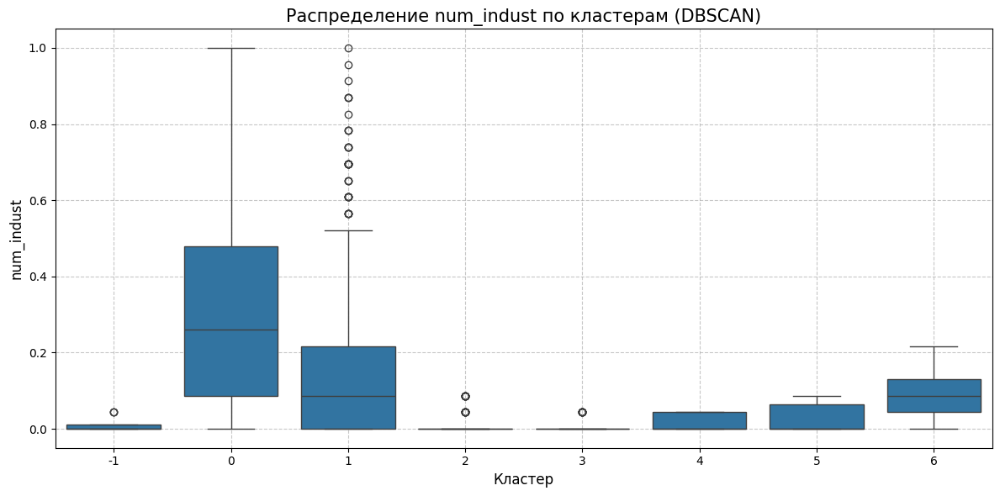

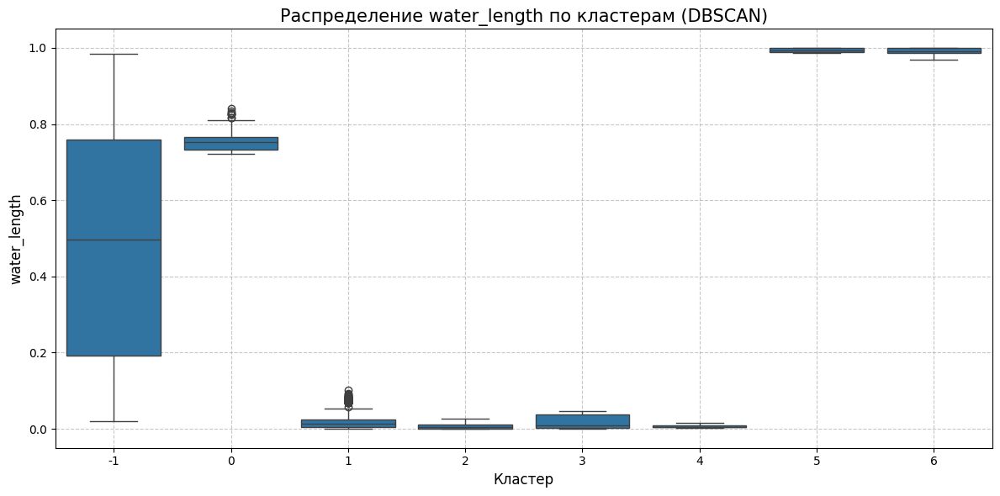

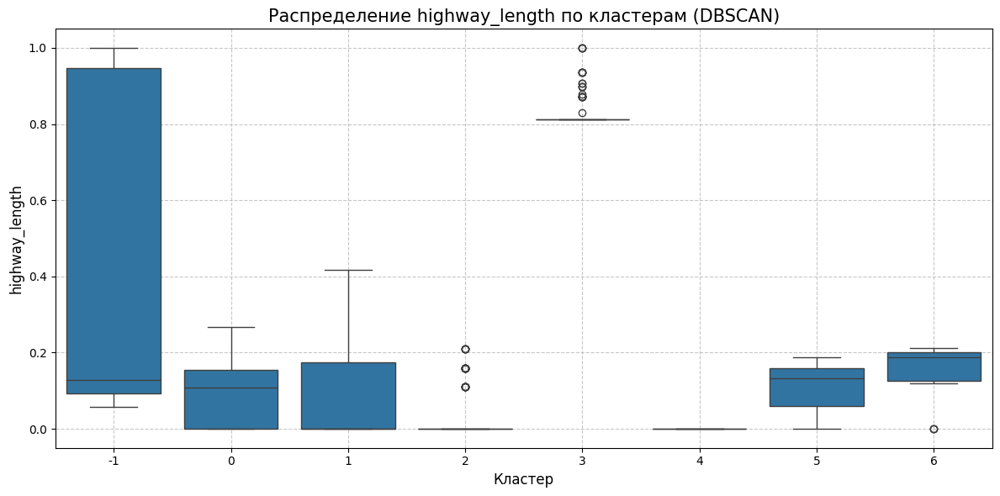

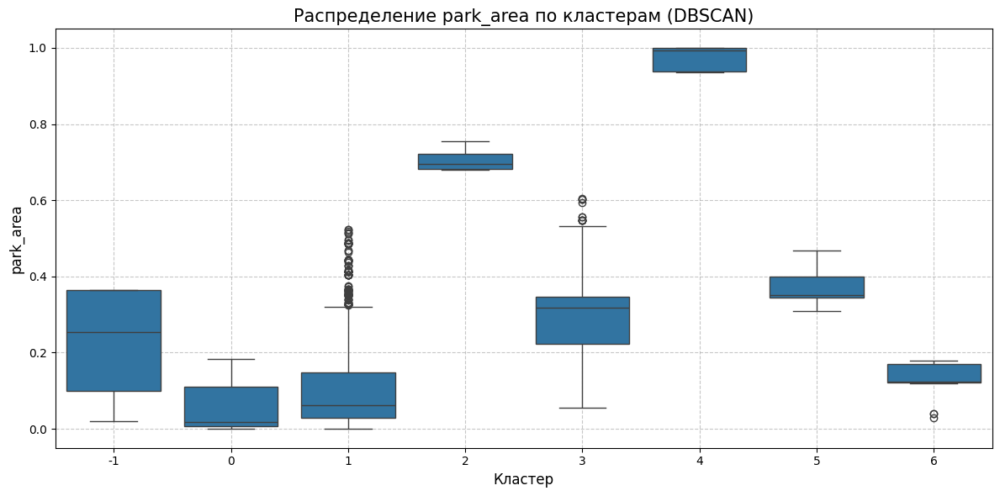

In [ ]:
dbscan_analysis = analyze_clusters(X_scaled, dbscan_labels, "DBSCAN", features)

In [ ]:
import hdbscan

# Применение HDBSCAN
hdbscanner = hdbscan.HDBSCAN()
hdbscan_labels = hdbscanner.fit_predict(X_scaled)

In [ ]:
# Оценка качества кластеризации
hdbscan_metrics = evaluate_clustering(X_scaled, hdbscan_labels, "HDBSCAN")


Метрики качества кластеризации для HDBSCAN:
Количество кластеров: 78
Silhouette Score: 0.0897
Calinski-Harabasz Index: 33.4514
Davies-Bouldin Index: 1.1268


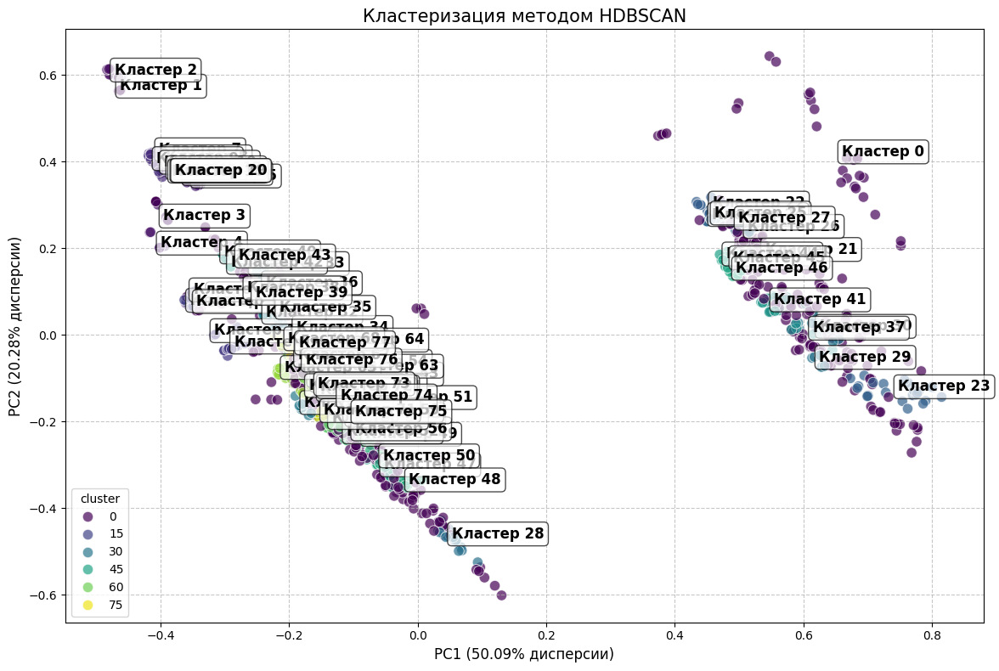

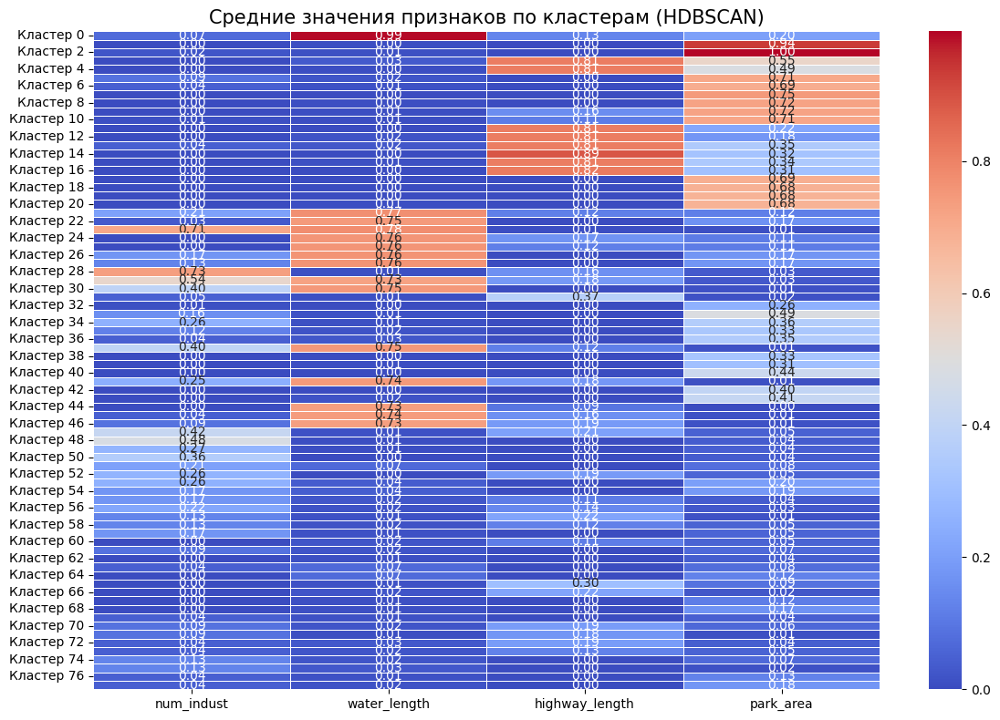

array([0.50092288, 0.20283224])

In [ ]:
# Визуализация результатов
visualize_clusters_2d(X_scaled, hdbscan_labels, "HDBSCAN", features)


--- Анализ кластеров для метода HDBSCAN ---
Количество кластеров: 78

Распределение точек по кластерам:


,Количество точек,Процент
-1,466,32.75
0,22,1.55
1,6,0.42
2,10,0.70
3,11,0.77
...,...,...
73,9,0.63
74,17,1.19
75,8,0.56
76,6,0.42



Средние значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
-1,0.248367,0.274499,0.146913,0.136542
0,0.071146,0.991956,0.132736,0.204483
1,0.000000,0.003957,0.000000,0.937167
2,0.021739,0.008838,0.000000,0.996737
3,0.000000,0.033511,0.812206,0.551047
...,...,...,...,...
73,0.043478,0.021988,0.125048,0.053166
74,0.130435,0.020873,0.000000,0.066911
75,0.130435,0.027520,0.000000,0.015035



Минимальные значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
-1,0.000000,0.000000,0.000000,0.000020
0,0.000000,0.968703,0.000000,0.028023
1,0.000000,0.002098,0.000000,0.936926
2,0.000000,0.003572,0.000000,0.985429
3,0.000000,0.002608,0.812206,0.532578
...,...,...,...,...
73,0.043478,0.012387,0.110074,0.035048
74,0.130435,0.006513,0.000000,0.028170
75,0.130435,0.020662,0.000000,0.000707



Максимальные значения признаков по кластерам:


,num_indust,water_length,highway_length,park_area
cluster,,,,
-1,1.000000,0.985114,1.000000,0.755573
0,0.217391,1.000000,0.211388,0.467004
1,0.000000,0.004833,0.000000,0.937735
2,0.043478,0.015578,0.000000,1.000000
3,0.000000,0.040219,0.812206,0.594731
...,...,...,...,...
73,0.043478,0.029926,0.148030,0.076713
74,0.130435,0.027774,0.000000,0.087654
75,0.130435,0.031276,0.000000,0.024158


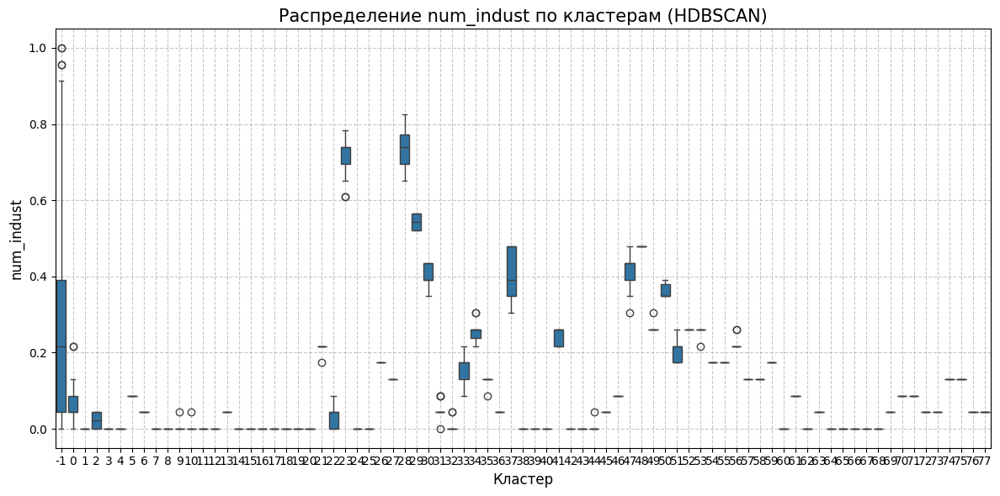

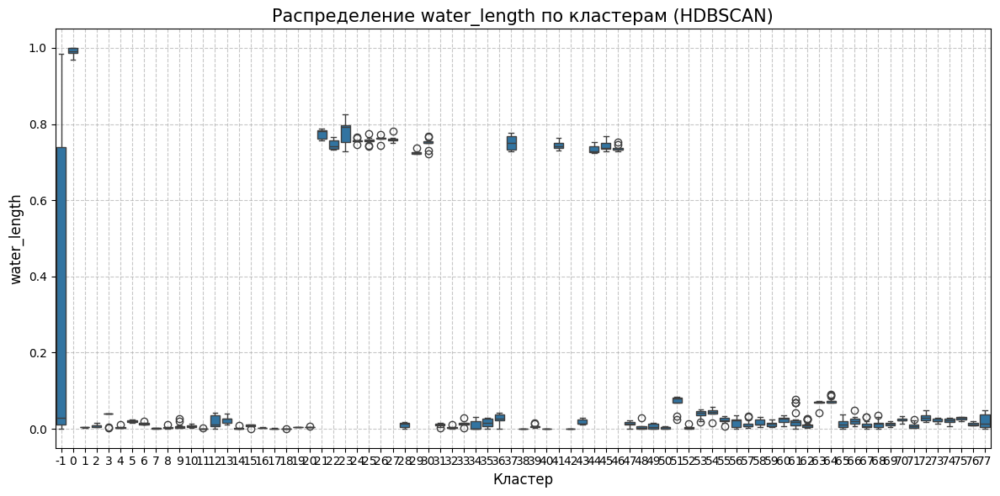

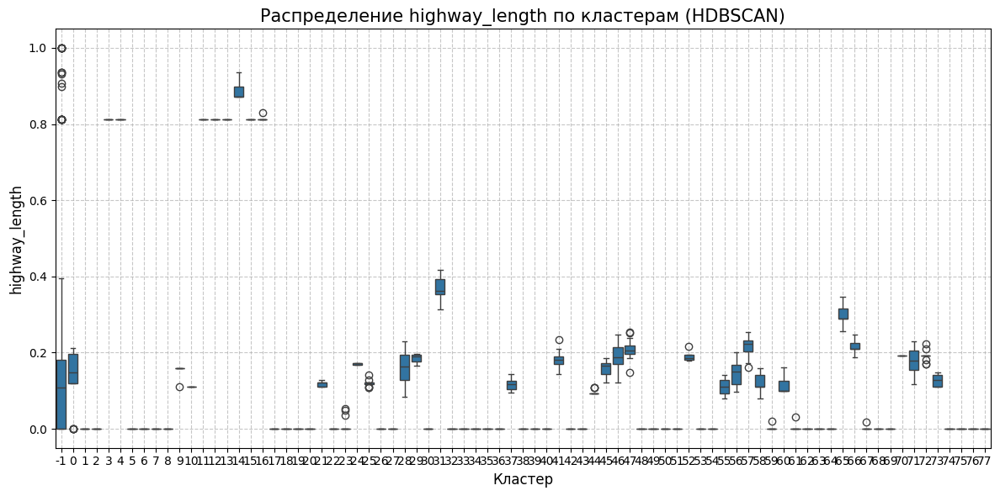

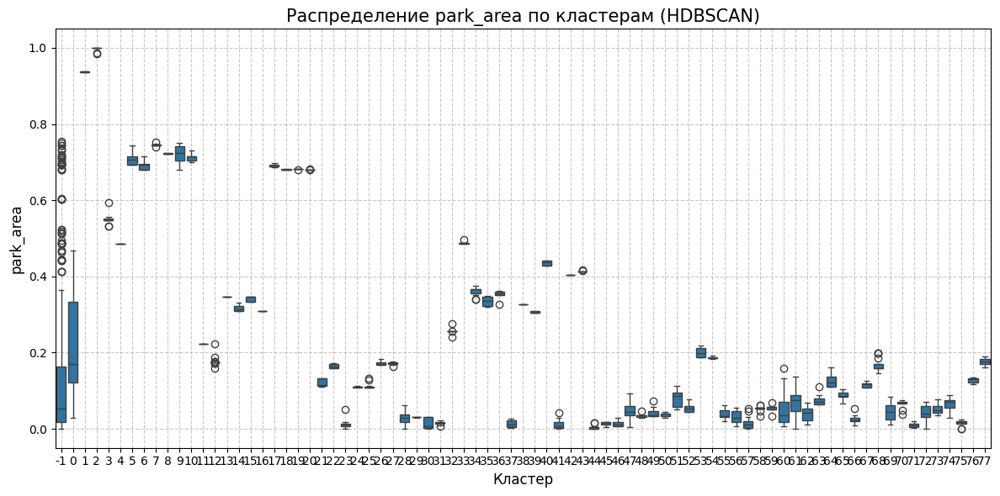

In [ ]:
hdbscan_analysis = analyze_clusters(X_scaled, hdbscan_labels, "HDBSCAN", features)

### **6. Разработка моделей классификации**


- На основе результатов лучшего алгоритма кластеризации подготовьте данные для обучения классификаторов
- Обучите и сравните различные модели классификации:
  - Логистическая регрессия
  - Дерево решений
  - Случайный лес
  - Градиентный бустинг
  - SVM
  - K-ближайших соседей
- Оцените качество моделей с использованием кросс-валидации
- Выберите оптимальную модель и сохраните её для дальнейшего использования

In [ ]:
# Создаем таблицу сравнения алгоритмов кластеризации
comparison_data = []

# K-means
comparison_data.append({
    'Алгоритм': 'K-means',
    'Количество кластеров': len(np.unique(kmeans_labels)),
    'Silhouette Score': kmeans_metrics['silhouette'],
    'Calinski-Harabasz': kmeans_metrics['calinski'],
    'Davies-Bouldin': kmeans_metrics['davies']
})

# Агломеративная кластеризация
comparison_data.append({
    'Алгоритм': 'Агломеративная',
    'Количество кластеров': len(np.unique(agglom_labels)),
    'Silhouette Score': agglom_metrics['silhouette'],
    'Calinski-Harabasz': agglom_metrics['calinski'],
    'Davies-Bouldin': agglom_metrics['davies']
})

# Спектральная кластеризация
comparison_data.append({
    'Алгоритм': 'Спектральная',
    'Количество кластеров': len(np.unique(spectral_labels)),
    'Silhouette Score': spectral_metrics['silhouette'],
    'Calinski-Harabasz': spectral_metrics['calinski'],
    'Davies-Bouldin': spectral_metrics['davies']
})

# DBSCAN
n_clusters_dbscan = len(np.unique(dbscan_labels))
if -1 in dbscan_labels:
    n_clusters_dbscan -= 1
comparison_data.append({
    'Алгоритм': 'DBSCAN',
    'Количество кластеров': n_clusters_dbscan,
    'Silhouette Score': dbscan_metrics['silhouette'],
    'Calinski-Harabasz': dbscan_metrics['calinski'],
    'Davies-Bouldin': dbscan_metrics['davies']
})

# HDBSCAN
n_clusters_hdbscan = len(np.unique(hdbscan_labels))
if -1 in hdbscan_labels:
    n_clusters_hdbscan -= 1
comparison_data.append({
    'Алгоритм': 'HDBSCAN',
    'Количество кластеров': n_clusters_hdbscan,
    'Silhouette Score': hdbscan_metrics['silhouette'],
    'Calinski-Harabasz': hdbscan_metrics['calinski'],
    'Davies-Bouldin': hdbscan_metrics['davies']
})

# Создаем DataFrame с результатами сравнения
comparison_df = pd.DataFrame(comparison_data)

In [ ]:
# Выводим таблицу сравнения
print("Сравнение алгоритмов кластеризации:")
display(comparison_df)

Сравнение алгоритмов кластеризации:


,Алгоритм,Количество кластеров,Silhouette Score,Calinski-Harabasz,Davies-Bouldin
0,K-means,6,0.527190,2044.153188,0.651888
1,Агломеративная,6,0.516397,1930.930198,0.675454
2,Спектральная,6,0.521929,1959.193193,0.630451
3,DBSCAN,7,0.443943,688.943880,1.093925
4,HDBSCAN,78,0.089675,33.451414,1.126849


In [ ]:
# Выбираем алгоритм с наивысшим Calinski-Harabasz
best_algorithm_idx = comparison_df['Calinski-Harabasz'].idxmax()
best_algorithm = comparison_df.iloc[best_algorithm_idx]['Алгоритм']

print(f"\nАлгоритм с наилучшим Calinski-Harabasz: {best_algorithm}")


Алгоритм с наилучшим Calinski-Harabasz: K-means


In [ ]:
# Выбираем соответствующие метки кластеров
if best_algorithm == 'K-means':
    best_labels = kmeans_labels
elif best_algorithm == 'Агломеративная':
    best_labels = agglom_labels
elif best_algorithm == 'Спектральная':
    best_labels = spectral_labels
elif best_algorithm == 'DBSCAN':
    best_labels = dbscan_labels
elif best_algorithm == 'HDBSCAN':
    best_labels = hdbscan_labels

In [ ]:
# Добавляем метки кластеров в исходный GeoDataFrame
h3_gdf['cluster'] = best_labels

# Создаем карту с кластерами
map_clusters = leafmap.Map(center=[(bbox[1]+bbox[3])/2, (bbox[0]+bbox[2])/2], zoom=12)
map_clusters.add_data(
    h3_gdf,
    column="cluster",
    cmap="OrRd_r",
    scheme='EqualInterval',
    legend_title="Кластеры",
    layer_name="H3 Кластеризация",
    style={
        "stroke": False,
        "weight": 0.5,
        "fillOpacity": 0.7,
    }
)

# Отображаем карту
map_clusters

Map(center=[55.87645, 38.44345], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', '…

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import joblib

In [ ]:
if -1 in best_labels:
    mask = best_labels != -1
    X_filtered = X_scaled[mask]
    y_filtered = best_labels[mask]
else:
    X_filtered = X_scaled
    y_filtered = best_labels

# Разделяем данные на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(
    X_filtered, y_filtered, test_size=0.4, random_state=42)

print(f"Размер обучающей выборки: {X_train.shape[0]} образцов")
print(f"Размер тестовой выборки: {X_test.shape[0]} образцов")

Размер обучающей выборки: 853 образцов
Размер тестовой выборки: 570 образцов


In [ ]:
classifiers = {
    'Логистическая регрессия': LogisticRegression(max_iter=1000, random_state=42),
    'Дерево решений': DecisionTreeClassifier(random_state=42),
    'Случайный лес': RandomForestClassifier(random_state=42),
    'Градиентный бустинг': GradientBoostingClassifier(random_state=42),
    'SVM': SVC(probability=True, random_state=42),
    'K-ближайших соседей': KNeighborsClassifier(),
}

In [ ]:
# Обучение и оценка моделей
results = []

for name, clf in classifiers.items():
    print(f"\nОбучение модели: {name}...")

    # Обучение модели
    clf.fit(X_train, y_train)

    # Предсказание на тестовой выборке
    y_pred = clf.predict(X_test)

    # Расчет метрик
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='macro')
    recall = recall_score(y_test, y_pred, average='macro')
    f1 = f1_score(y_test, y_pred, average='macro')

    # Кросс-валидация
    cv_scores = cross_val_score(clf, X_filtered, y_filtered, cv=5, scoring='f1_macro')
    cv_f1 = cv_scores.mean()

    # Сохраняем результаты
    results.append({
        'Модель': name,
        'Точность (accuracy)': accuracy,
        'Полнота (recall)': recall,
        'Точность (precision)': precision,
        'F1-мера': f1,
        'F1-мера (CV)': cv_f1,
        'Классификатор': clf
    })

# Создаем DataFrame с результатами
results_df = pd.DataFrame([
    {k: v for k, v in r.items() if k != 'Классификатор'}
    for r in results
])

# Сортируем по F1-мере
results_df = results_df.sort_values(by='F1-мера (CV)', ascending=False)

# Выводим таблицу результатов
print("\nРезультаты классификации (сортировка по F1-мере):")
results_df


Обучение модели: Логистическая регрессия...

Обучение модели: Дерево решений...

Обучение модели: Случайный лес...

Обучение модели: Градиентный бустинг...

Обучение модели: SVM...

Обучение модели: K-ближайших соседей...

Результаты классификации (сортировка по F1-мере):


,Модель,Точность (accuracy),Полнота (recall),Точность (precision),F1-мера,F1-мера (CV)
3,Градиентный бустинг,0.992982,0.989312,0.995086,0.992056,0.997458
2,Случайный лес,0.992982,0.989312,0.995086,0.992056,0.997458
4,SVM,0.991228,0.985274,0.995532,0.990161,0.996654
1,Дерево решений,0.996491,0.997431,0.994150,0.995758,0.995918
5,K-ближайших соседей,0.985965,0.982051,0.988293,0.984931,0.994119
0,Логистическая регрессия,0.933333,0.898379,0.969523,0.926276,0.944204


In [ ]:
best_model_name = results_df.iloc[0]['Модель']
best_model_idx = [r['Модель'] for r in results].index(best_model_name)
best_model = results[best_model_idx]['Классификатор']
print(f"\nЛучшая модель: {best_model_name} с F1-мерой: {results_df.iloc[0]['F1-мера (CV)']:.4f}")


Лучшая модель: Градиентный бустинг с F1-мерой: 0.9975


In [ ]:
y_pred_best = best_model.predict(X_test)

print("\nОтчёт о классификации для лучшей модели:")
print(classification_report(y_test, y_pred_best))


Отчёт о классификации для лучшей модели:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       255
           1       0.98      1.00      0.99        55
           2       1.00      1.00      1.00        38
           3       1.00      0.95      0.97        57
           4       1.00      1.00      1.00        78
           5       1.00      0.99      0.99        87

    accuracy                           0.99       570
   macro avg       1.00      0.99      0.99       570
weighted avg       0.99      0.99      0.99       570



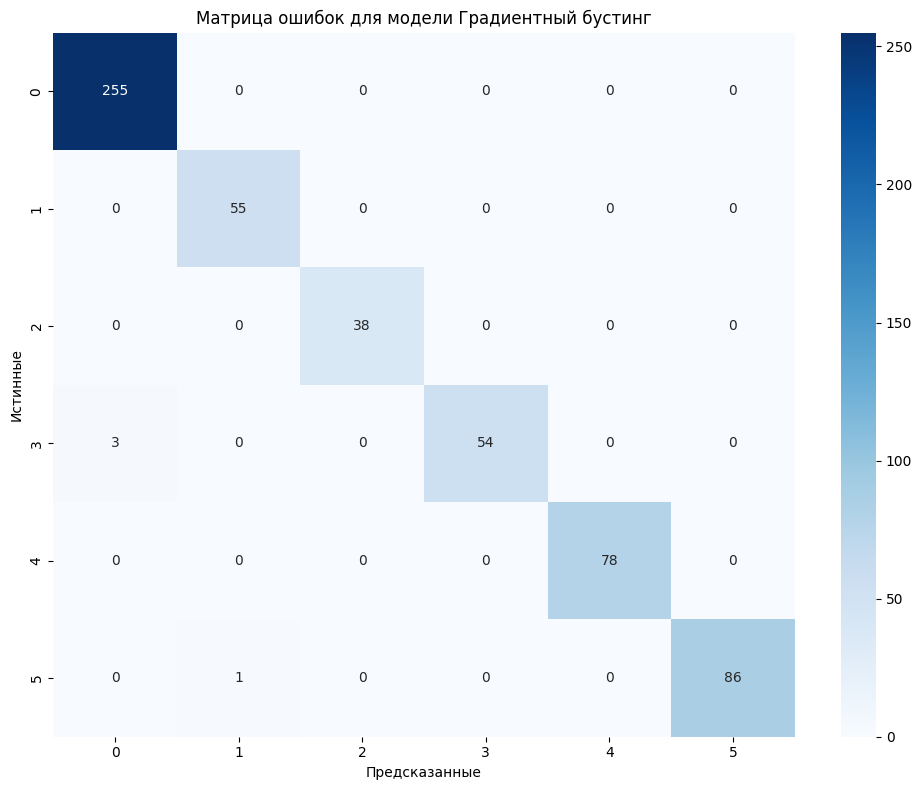

In [ ]:
cm = pd.crosstab(y_test, y_pred_best, rownames=['Истинные'], colnames=['Предсказанные'])
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title(f'Матрица ошибок для модели {best_model_name}')
plt.tight_layout()
plt.show()

In [ ]:
joblib.dump(best_model, 'best_classification_model.joblib')
print(f"\nЛучшая модель сохранена как 'best_classification_model.joblib'")


Лучшая модель сохранена как 'best_classification_model.joblib'


## **Требования к отчету (Структуре блокнота)**



1. Описание выбранной территории и источников данных
2. Методика расчета экологических показателей с обоснованием выбора буферных зон и весовых коэффициентов
3. Сравнительный анализ результатов кластеризации с обоснованием выбора оптимального алгоритма
4. Карты распределения экологических факторов и результатов кластеризации
5. Подробная характеристика выявленных экологических зон (кластеров) с рекомендациями по их развитию
6. Анализ эффективности разработанных моделей классификации
7. Выводы об экологическом состоянии исследуемой территории и возможностях практического применения полученных результатов

**1. Описание выбранной территории и источников данных**
- г. Ногинск
- источник: Open Street Map

**2. Методика расчета экологических показателей с обоснованием выбора буферных зон и весовых коэффициентов**
- Количество промзон (num_indust) – в радиусе 1600 м.

- Длина магистралей (highway_length) – в радиусе 1600 м.

- Площадь парков (park_area) – в радиусе 800 м (зона пешеходной доступности).

- Длина водных объектов (water_length) – в радиусе 1600 м.

-  Все показатели были масштабированы методом MinMaxScaler для приведения к единому диапазону.

- index_score = (water_length + park_area) - (num_indust + highway_length)

**3. Сравнительный анализ результатов кластеризации с обоснованием выбора оптимального алгоритма**

In [ ]:
display(comparison_df)

,Алгоритм,Количество кластеров,Silhouette Score,Calinski-Harabasz,Davies-Bouldin
0,K-means,6,0.527190,2044.153188,0.651888
1,Агломеративная,6,0.516397,1930.930198,0.675454
2,Спектральная,6,0.521929,1959.193193,0.630451
3,DBSCAN,7,0.443943,688.943880,1.093925
4,HDBSCAN,78,0.089675,33.451414,1.126849


In [ ]:
kmeans_metrics = evaluate_clustering(X_scaled, kmeans_labels, "K-means")


Метрики качества кластеризации для K-means:
Количество кластеров: 6
Silhouette Score: 0.5272
Calinski-Harabasz Index: 2044.1532
Davies-Bouldin Index: 0.6519


- лучшая модель для кластеризации: **K-means**

**4. Карты распределения экологических факторов и результатов кластеризации**

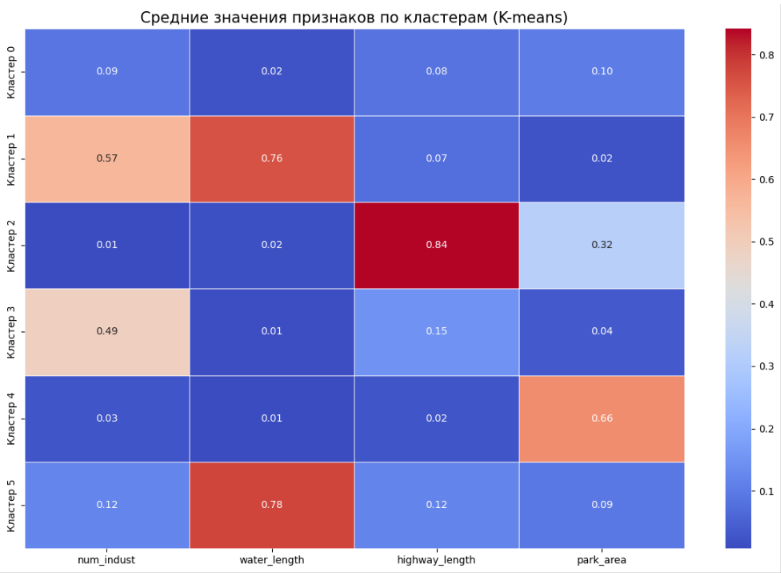

5. Подробная характеристика выявленных экологических зон (кластеров) с рекомендациями по их развитию

- Кластер 0: спальные, жилые районы
- Кластер 1: (если говорить конкретно о ногинске) старая промышленная зона у реки
- Кластер 2: трасса, проходящая мимо города
- Кластер 3: промышленные зоны/склады
- Кластер 4: парки, леса
- Кластер 5: водоёмы, прибрежные зоны

**6. Анализ эффективности разработанных моделей классификации**


In [ ]:
results_df

,Модель,Точность (accuracy),Полнота (recall),Точность (precision),F1-мера,F1-мера (CV)
3,Градиентный бустинг,0.992982,0.989312,0.995086,0.992056,0.997458
2,Случайный лес,0.992982,0.989312,0.995086,0.992056,0.997458
4,SVM,0.991228,0.985274,0.995532,0.990161,0.996654
1,Дерево решений,0.996491,0.997431,0.994150,0.995758,0.995918
5,K-ближайших соседей,0.985965,0.982051,0.988293,0.984931,0.994119
0,Логистическая регрессия,0.933333,0.898379,0.969523,0.926276,0.944204


- лучший классификатор - **Градиентный бустинг**

**7. Выводы об экологическом состоянии исследуемой территории и возможностях практического применения полученных результатов**

- много промышленных зон (большая зона риска)
- при этом много лесов
- через город протекает река
- мимо города проходит несколько федеральных трасс
- в общем город **достаточно загрязнён**